In [1]:
prediction_data = '/work/lpdi/users/khakzad/Surfacome/database/dataset_all_surfaces.pt'
# pdb_data = '/work/lpdi/users/khakzad/Surfacome/pdbs/surfacome_chopped_protonated/'
# pointcloud_results = '/work/lpdi/users/khakzad/Surfacome/outputs/'
surfacome_groups = '/work/lpdi/users/khakzad/Surfacome/database/surfacome_groups.csv'
p_families = '/work/lpdi/users/khakzad/Surfacome/database/table_S3_surfaceome.csv'

In [2]:
# import nglview as ng
# import ipywidgets as widgets
import numpy as np
# import torch
import os
# from nglview.color import ColormakerRegistry
# from pdbparser.pdbparser import pdbparser

In [3]:
SAVE_PLOT = False

## Loading the csv file of MaSIF-site predictions

In [4]:
import pandas as pd
result_area = pd.read_csv('/work/lpdi/users/khakzad/Surfacome/database/result_metrics_all_new_2.csv')

In [5]:
result_area

,acc,sequence,sasa,point2residue,no_binding_sites,filtered_site_points,normalized_labels,cluster_for_all_points,area_angstrom2,area_points,sequence_compositions_all_clusters,centroids,flat_score,Kyte_Doolittle
0,P08195,"['GLY', 'LEU', 'SER', 'LYS', 'GLU', 'GLU', 'LE...","vector1_double[126.269, 87.6518, 65.1595, 162....",[152 152 152 151 152 152 152 152 151 151 152 1...,"[9, 1]",[[-1.75613422e+01 -9.00413418e+00 -9.75214958e...,[0.125 0.125 0.125 0.125 0.25 0.25 0. 0.1...,[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0...,[5612.734140467538],[2848],"[{'cluster_8': ['163_GLY', '164_LEU', '165_SER...",[200],"[array([0.86758811, 0.09165903, 0.04075286])]","[{'cluster_8': [200, 17.600000000000005]}]"
1,P08908,"['THR', 'THR', 'GLY', 'ILE', 'SER', 'ASP', 'VA...","vector1_double[148.605, 99.5941, 43.1583, 133....",[213 213 213 213 213 213 213 213 213 213 213 2...,"[18, 1]",[[-2.75845051e+01 1.65284145e+00 -6.39325047e...,[0.05882353 0.05882353 0.05882353 0.05882353 0...,[ 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 ...,[3148.4962064833207],[978],"[{'cluster_2': ['49_CYS', '52_LEU', '53_GLY', ...",[397],"[array([0.67817227, 0.28393586, 0.03789187])]","[{'cluster_2': [397, 30.200000000000003]}]"
2,P28222,"['TYR', 'ILE', 'TYR', 'GLN', 'ASP', 'SER', 'IL...","vector1_double[211.442, 50.8019, 34.9686, 10.2...",[202 202 202 202 202 202 202 202 202 202 202 2...,"[17, 2]",[[-2.43518639e+01 -3.33992815e+00 -9.78890061e...,[0.0625 0.0625 0.0625 0.0625 0.0625 0.0625 0.0...,[ 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 ...,"[941.9540033758672, 2547.391431238875]","[259, 669]","[{'cluster_2': ['68_ALA', '69_PHE', '71_ILE', ...","[89, 315]","[array([0.79773264, 0.14246265, 0.05980471]), ...","[{'cluster_2': [89, 18.3]}, {'cluster_3': [315..."
3,P28221,"['ALA', 'TRP', 'ASP', 'PRO', 'ARG', 'THR', 'LE...","vector1_double[155.438, 220.904, 73.8747, 101....",[ 39 39 39 39 199 199 199 199 199 199 199 1...,"[17, 2]",[[-2.63833103e+01 -1.63054824e+00 -9.49820137e...,[0.0625 0.0625 0.0625 0.0625 0.0625 0.0625 0.0...,[ 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 ...,"[3359.233078133291, 1409.2325554160886]","[1323, 414]","[{'cluster_2': ['39_ILE', '42_ALA', '43_VAL', ...","[85, 209]","[array([0.51995667, 0.36238015, 0.11766318]), ...","[{'cluster_2': [85, 126.79999999999995]}, {'cl..."
4,P28566,"['ILE', 'ARG', 'PRO', 'LYS', 'THR', 'ILE', 'TH...","vector1_double[166.447, 175.668, 108.735, 48.8...",[159 159 159 159 159 159 159 159 159 159 159 1...,"[23, 1]",[[-1.93558311e+01 -9.00346661e+00 -5.62266445e...,[0.04545455 0.04545455 0. 0. 0...,[ 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 ...,[1782.7322396409852],[638],"[{'cluster_16': ['35_LEU', '38_LEU', '39_LEU',...",[342],"[array([0.82940868, 0.14003894, 0.03055238])]","[{'cluster_16': [342, 41.99999999999999]}]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2706,P60852,"['PRO', 'GLY', 'LEU', 'ARG', 'HIS', 'SER', 'TY...","vector1_double[156.012, 42.7241, 11.7823, 185....",[236 236 236 236 236 236 236 236 236 236 236 2...,"[7, 3]",[[-5.24877968e+01 7.39893317e-03 1.75690117e...,[0.16666667 0.16666667 0.16666667 0.16666667 0...,[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0...,"[7082.787541806182, 2327.5309478868417, 624.67...","[3825, 889, 253]","[{'cluster_2': ['42_ASP', '43_CYS', '44_GLY', ...","[334, 618, 458]","[array([0.56139152, 0.28803725, 0.15057123]), ...","[{'cluster_2': [334, 38.49999999999999]}, {'cl..."
2707,Q05996,"['ALA', 'PHE', 'PRO', 'GLY', 'THR', 'VAL', 'TH...","vector1_double[137.003, 27.5417, 103.223, 14.5...",[ 19 19 19 19 19 19 19 19 19 19 19 ...,"[13, 6]",[[-4.02205353e+01 -1.07326355e+01 4.02266731e...,[0.08333333 0.08333333 0.08333333 0.08333333 0...,[ 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 ...,"[3738.9284872772937, 913.4041013972164, 583.31...","[1596, 235, 250, 873, 376, 304]","[{'cluster_2': ['49_PHE', '53_VAL', '55_CYS', ...","[255, 356, 380, 730, 598, 435]","[array([0.59355678, 0.2671131 , 0.13933011]), ...","[{'cluster_2': [255, 2.1999999999999975]}, {'c..."
2708,P21754,"['VAL', 'GLN', 'PRO', 'VAL', 'LEU', 'VAL', 'GL...","vector1_d

In [6]:
p_groups = pd.read_csv(p_families, sep=";")
p_groups

,UniProt name,UniProt_accession,UniProt description,UniProt gene,Surfaceome Label,Surfaceome Label Source,Comment,length,TM domains,signalpeptide,...,CSPA id,UniProt subcellular,UniProt keywords,UniProt uniref,COMPARTMENTS link,COMPARTMENTS benchmark pos,COMPARTMENTS benchmark neg,HPA antibody,DrugBank approved drug IDs,GeneID
0,S12A8_HUMAN,A0AV02,Solute carrier family 12 member 8,SLC12A8,surface,machine learning,NaN,714,13,0,...,NaN,Membrane (Multi-pass membrane protein),Alternative splicing;Chloride;Complete proteom...,UniRef100_A0AV02;UniRef90_A0AV02;UniRef50_A0AV02,link,NaN,Cytoskeleton;Cytosol;Endoplasmic Reticulum;End...,HPA031123,NaN,84561
1,ESYT3_HUMAN,A0FGR9,Extended synaptotagmin-3,ESYT3,surface,pos. trainingset,NaN,886,2,0,...,NaN,Cell membrane (Peripheral membrane protein);En...,Alternative splicing;Calcium;Cell membrane;Com...,UniRef100_A0FGR9;UniRef90_A0FGR9;UniRef50_A0FGR9,link,Plasma membrane,Cytoskeleton;Cytosol;Endoplasmic Reticulum;End...,HPA039200,NaN,83850
2,SC5AA_HUMAN,A0PJK1,Sodium/glucose cotransporter 5,SLC5A10,surface,machine learning,NaN,596,14,0,...,NaN,Cell membrane (Multi-pass membrane protein),Alternative splicing;Cell membrane;Complete pr...,UniRef100_A0PJK1;UniRef90_A0PJK1;UniRef50_A0PJK1,link,NaN,NaN,HPA052014,NaN,125206
3,CLRN2_HUMAN,A0PK11,Clarin-2,CLRN2,surface,machine learning,NaN,232,4,0,...,NaN,Membrane (Multi-pass membrane protein),Complete proteome;Glycoprotein;Membrane;Polymo...,UniRef100_A0PK11;UniRef90_A0PK11;UniRef50_A0PK11,link,NaN,NaN,HPA042407,NaN,645104
4,CC50C_HUMAN,A0ZSE6,Cell cycle control protein 50C,TMEM30C,surface,machine learning,NaN,113,1,0,...,NaN,Membrane (Single-pass membrane protein),Complete proteome;Glycoprotein;Membrane;Refere...,UniRef100_A0ZSE6;UniRef90_A0ZT23-2;UniRef50_A0...,link,NaN,Cytoskeleton;Cytosol;Endoplasmic Reticulum;End...,no,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2881,CAD10_HUMAN,Q9Y6N8,Cadherin-10,CDH10,surface,pos. trainingset,NaN,788,1,1,...,Q9Y6N8,Cell membrane (Single-pass type I membrane pro...,Calcium;Cell adhesion;Cell membrane;Cleavage o...,UniRef100_Q9Y6N8;UniRef90_Q9Y6N8;UniRef50_P55285,link,Plasma membrane,Cytoskeleton;Cytosol;Endoplasmic Reticulum;End...,HPA010651,NaN,1008
2882,TNR11_HUMAN,Q9Y6Q6,Tumor necrosis factor receptor superfamily mem...,TNFRSF11A,surface,pos. trainingset,NaN,616,1,1,...,Q9Y6Q6,Cell membrane (Single-pass type I membrane pro...,3D-structure;Alternative splicing;Cell membran...,UniRef100_Q9Y6Q6;UniRef90_Q9Y6Q6;UniRef50_Q9Y6Q6,link,NaN,NaN,CAB010391;HPA027728,NaN,8792
2883,S4A4_HUMAN,Q9Y6R1,Electrogenic sodium bicarbonate cotransporter 1,SLC4A4,surface,machine learning,NaN,1079,10,0,...,NaN,Basolateral cell membrane (Multi- pass membran...,Alternative splicing;Cell membrane;Complete pr...,UniRef100_Q9Y6R1;UniRef90_Q9Y6R1;UniRef50_Q9Y6R1,link,NaN,NaN,CAB022493;HPA035628;HPA035629,NaN,8671
2884,ICOS_HUMAN,Q9Y6W8,Inducible T-cell costimulator,ICOS,surface,machine learning,NaN,199,1,1,...,NaN,Cell membrane (Single-pass type I membrane pro...,Alternative splicing;Cell membrane;Complete pr...,UniRef100_Q9Y6W8;UniRef90_Q9Y6W8;UniRef50_Q9Y6W8,link,Plasma membrane,Cytoskeleton;Cytosol;Endoplasmic Reticulum;End...,CAB032575,NaN,29851


## Making a simplified parsable table "df_result"

### The new table will have some important information from previous one including:
* acc
* main class
* sub class

In [7]:
from ast import literal_eval
bad_acc = ["P0DP58", "P0DPA2", "P0DMS8"]
all_data = []
for index, row in result_area.iterrows():
    acc = row['acc']
    try:
        if acc in bad_acc:
            continue
        else:
            mainclass = list(p_groups.query(f'UniProt_accession=="{acc}"')['Membranome Almen main-class'])[0]
            subclass = list(p_groups.query(f'UniProt_accession=="{acc}"')['Membranome Almen sub-class'])[0].split(";")[0]
            if mainclass == "Enzymes":
                if subclass.split(".")[0] == "1":
                    subclass1 = "Oxidoreductases"
                elif subclass.split(".")[0] == "2":
                    subclass1 = "Transferases"
                elif subclass.split(".")[0] == "3":
                    subclass1 = "Hydrolases"                
                elif subclass.split(".")[0] == "4":
                    subclass1 = "Lyases"                
                elif subclass.split(".")[0] == "5":
                    subclass1 = "Isomerases"                
                elif subclass.split(".")[0] == "6":
                    subclass1 = "Ligases"
                elif subclass.split(".")[0] == "7":
                    subclass1 = "Translocases"
                elif "," in subclass.split(".")[0]:
                    subclass1 = "Multiple functions"
            elif subclass == "KInase":
                subclass1 = "Kinase"
            else:
                subclass1 = subclass
            all_data.append(
                {"acc" : acc,
                "site" : len(literal_eval(row['centroids'])),
                "main_class" : mainclass,
                "sub_class_1" : subclass1,
                "sub_class_all" : list(p_groups.query(f'UniProt_accession=="{acc}"')['Membranome Almen sub-class'])[0]
                })
    except(KeyError):
        continue

In [8]:
df_result = pd.DataFrame.from_records(all_data)
df_result

,acc,site,main_class,sub_class_1,sub_class_all
0,P08195,1,Transporters,SLC,SLC;Other;SLC3
1,P08908,1,Receptors,GPCR,GPCR;Rhodopsin
2,P28222,2,Receptors,GPCR,GPCR;Rhodopsin
3,P28221,2,Receptors,GPCR,GPCR;Rhodopsin
4,P28566,1,Receptors,GPCR,GPCR;Rhodopsin
...,...,...,...,...,...
2703,P60852,3,Unclassified,Unclassified,Unclassified
2704,Q05996,6,Unclassified,Unclassified,Unclassified
2705,P21754,4,Unclassified,Unclassified,Unclassified
2706,Q12836,5,Unclassified,Unclassified,Unclassified


## MaSIF-Seed-Search runs

In [9]:
seed_count_a = '/work/lpdi/users/khakzad/Surfacome/database/seed_count_a_2.txt'
seed_count_b = '/work/lpdi/users/khakzad/Surfacome/database/seed_count_b_2.txt'

### updating the df_result dataframe and add four more information:
* binding sites,
* area of binding sites, 
* hydrophobicity
* number detected alpha seeds, 
* number of detected beta seeds
* residues in all binding sites per protein

In [10]:
list_bs = []
list_area = []
list_accs = list(df_result["acc"])

In [11]:
from ast import literal_eval
for ids in list_accs:
    list_bs.append(literal_eval(list(result_area[result_area['acc'] == ids]['centroids'])[0]))
    list_area.append(literal_eval(list(result_area[result_area['acc'] == ids]['area_angstrom2'])[0]))

In [12]:
df_result['binding_sites'] = list_bs
df_result['area_a2'] = list_area
df_result

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2
0,P08195,1,Transporters,SLC,SLC;Other;SLC3,[200],[5612.734140467538]
1,P08908,1,Receptors,GPCR,GPCR;Rhodopsin,[397],[3148.4962064833207]
2,P28222,2,Receptors,GPCR,GPCR;Rhodopsin,"[89, 315]","[941.9540033758672, 2547.391431238875]"
3,P28221,2,Receptors,GPCR,GPCR;Rhodopsin,"[85, 209]","[3359.233078133291, 1409.2325554160886]"
4,P28566,1,Receptors,GPCR,GPCR;Rhodopsin,[342],[1782.7322396409852]
...,...,...,...,...,...,...,...
2703,P60852,3,Unclassified,Unclassified,Unclassified,"[334, 618, 458]","[7082.787541806182, 2327.5309478868417, 624.67..."
2704,Q05996,6,Unclassified,Unclassified,Unclassified,"[255, 356, 380, 730, 598, 435]","[3738.9284872772937, 913.4041013972164, 583.31..."
2705,P21754,4,Unclassified,Unclassified,Unclassified,"[401, 242, 153, 42]","[1586.5368695422162, 1516.7376620964585, 1498...."
2706,Q12836,5,Unclassified,Unclassified,Unclassified,"[525, 486, 423, 282, 105]","[1116.2063184166739, 1003.8522992233186, 1589...."


In [13]:
list_alpha_seeds = []
list_beta_seeds = []
with open(seed_count_a) as file:
    a = file.readlines()

for ids in list_accs:
    temp_list_seed_count = []
    for item in a:
        acc = item.split(";")[0]
        if ids == acc[:-2]:
            temp_list_seed_count.append(literal_eval(item.split(";")[2]))
    
    list_alpha_seeds.append(temp_list_seed_count)
    

with open(seed_count_b) as file2:
    b = file2.readlines()

for ids in list_accs:
    temp_list_seed_count = []
    for item in b:
        acc = item.split(";")[0]
        if ids == acc[:-7]:
            temp_list_seed_count.append(literal_eval(item.split(";")[2]))
    
    list_beta_seeds.append(temp_list_seed_count)

In [14]:
df_result['alpha_seeds'] = list_alpha_seeds
df_result['beta_seeds'] = list_beta_seeds
df_result

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds
0,P08195,1,Transporters,SLC,SLC;Other;SLC3,[200],[5612.734140467538],[4],[1136]
1,P08908,1,Receptors,GPCR,GPCR;Rhodopsin,[397],[3148.4962064833207],[257],[227]
2,P28222,2,Receptors,GPCR,GPCR;Rhodopsin,"[89, 315]","[941.9540033758672, 2547.391431238875]","[1595, 6]","[4527, 48]"
3,P28221,2,Receptors,GPCR,GPCR;Rhodopsin,"[85, 209]","[3359.233078133291, 1409.2325554160886]","[3430, 261]","[6246, 193]"
4,P28566,1,Receptors,GPCR,GPCR;Rhodopsin,[342],[1782.7322396409852],[100],[921]
...,...,...,...,...,...,...,...,...,...
2703,P60852,3,Unclassified,Unclassified,Unclassified,"[334, 618, 458]","[7082.787541806182, 2327.5309478868417, 624.67...","[0, 50, 154]","[3, 98, 892]"
2704,Q05996,6,Unclassified,Unclassified,Unclassified,"[255, 356, 380, 730, 598, 435]","[3738.9284872772937, 913.4041013972164, 583.31...","[4, 128, 6, 0, 162, 0]","[3, 219, 36, 2, 233, 0]"
2705,P21754,4,Unclassified,Unclassified,Unclassified,"[401, 242, 153, 42]","[1586.5368695422162, 1516.7376620964585, 1498....","[0, 1528, 0, 337]","[525, 6107, 10, 307]"
2706,Q12836,5,Unclassified,Unclassified,Unclassified,"[525, 486, 423, 282, 105]","[1116.2063184166739, 1003.8522992233186, 1589....","[5, 0, 148, 1, 2258]","[225, 8, 339, 77, 3057]"


In [15]:
from ast import literal_eval
list_hp = []
for i, ids in enumerate(list_accs):
    temp_list_hp = []
    if list(result_area[result_area['acc'] == ids]['Kyte_Doolittle'])[0] == "[]":
        temp_list_hp.append(0)
    else:
        for centers in list_bs[i]:
            # print (centers)
            a = list(result_area[result_area['acc'] == ids]['Kyte_Doolittle'])[0]
            b = ''.join(a)
            # print(b)
            start_index = b.find(str(centers)+",")
            end_index = start_index + len((str(centers)))
            # print(start_index, end_index)
            if end_index+9 < len(b):
                hp = b[end_index+2:end_index+9].replace("]},","").replace("]}]","").replace("]}","").replace("]","")
            else:
                hp = b[end_index+2:len(b)].replace("]},","").replace("]}]","").replace("]}","").replace("]","")
            temp_list_hp.append(float(hp))
    list_hp.append(temp_list_hp)

In [16]:
df_result['hydrophobicity'] = list_hp
df_result

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds,hydrophobicity
0,P08195,1,Transporters,SLC,SLC;Other;SLC3,[200],[5612.734140467538],[4],[1136],[17.6]
1,P08908,1,Receptors,GPCR,GPCR;Rhodopsin,[397],[3148.4962064833207],[257],[227],[30.2]
2,P28222,2,Receptors,GPCR,GPCR;Rhodopsin,"[89, 315]","[941.9540033758672, 2547.391431238875]","[1595, 6]","[4527, 48]","[18.3, 48.2999]"
3,P28221,2,Receptors,GPCR,GPCR;Rhodopsin,"[85, 209]","[3359.233078133291, 1409.2325554160886]","[3430, 261]","[6246, 193]","[126.799, 37.9999]"
4,P28566,1,Receptors,GPCR,GPCR;Rhodopsin,[342],[1782.7322396409852],[100],[921],[41.9999]
...,...,...,...,...,...,...,...,...,...,...
2703,P60852,3,Unclassified,Unclassified,Unclassified,"[334, 618, 458]","[7082.787541806182, 2327.5309478868417, 624.67...","[0, 50, 154]","[3, 98, 892]","[38.4999, 47.9, -8.9]"
2704,Q05996,6,Unclassified,Unclassified,Unclassified,"[255, 356, 380, 730, 598, 435]","[3738.9284872772937, 913.4041013972164, 583.31...","[4, 128, 6, 0, 162, 0]","[3, 219, 36, 2, 233, 0]","[2.19999, 1.5, 5.39999, 26.5, -3.5999, -11.5]"
2705,P21754,4,Unclassified,Unclassified,Unclassified,"[401, 242, 153, 42]","[1586.5368695422162, 1516.7376620964585, 1498....","[0, 1528, 0, 337]","[525, 6107, 10, 307]","[50.1, -7.6, 10.3, -7.6]"
2706,Q12836,5,Unclassified,Unclassified,Unclassified,"[525, 486, 423, 282, 105]","[1116.2063184166739, 1003.8522992233186, 1589....","[5, 0, 148, 1, 2258]","[225, 8, 339, 77, 3057]","[13.3999, 2.59999, -12.399, 13.3, -16.4]"


In [17]:
list_AA_list = []
for i, ids in enumerate(list_accs):
    if list(result_area[result_area['acc'] == ids]['sequence_compositions_all_clusters'])[0] == "[]":
        list_AA_list.append(0)
    else:
        a = list(result_area[result_area['acc'] == ids]['sequence_compositions_all_clusters'])[0]
        b = literal_eval(a)
        list_AA_list.append(b)

# list_AA_list[2][1]

In [18]:
df_result['binding_site_residues'] = list_AA_list
df_result

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds,hydrophobicity,binding_site_residues
0,P08195,1,Transporters,SLC,SLC;Other;SLC3,[200],[5612.734140467538],[4],[1136],[17.6],"[{'cluster_8': ['163_GLY', '164_LEU', '165_SER..."
1,P08908,1,Receptors,GPCR,GPCR;Rhodopsin,[397],[3148.4962064833207],[257],[227],[30.2],"[{'cluster_2': ['49_CYS', '52_LEU', '53_GLY', ..."
2,P28222,2,Receptors,GPCR,GPCR;Rhodopsin,"[89, 315]","[941.9540033758672, 2547.391431238875]","[1595, 6]","[4527, 48]","[18.3, 48.2999]","[{'cluster_2': ['68_ALA', '69_PHE', '71_ILE', ..."
3,P28221,2,Receptors,GPCR,GPCR;Rhodopsin,"[85, 209]","[3359.233078133291, 1409.2325554160886]","[3430, 261]","[6246, 193]","[126.799, 37.9999]","[{'cluster_2': ['39_ILE', '42_ALA', '43_VAL', ..."
4,P28566,1,Receptors,GPCR,GPCR;Rhodopsin,[342],[1782.7322396409852],[100],[921],[41.9999],"[{'cluster_16': ['35_LEU', '38_LEU', '39_LEU',..."
...,...,...,...,...,...,...,...,...,...,...,...
2703,P60852,3,Unclassified,Unclassified,Unclassified,"[334, 618, 458]","[7082.787541806182, 2327.5309478868417, 624.67...","[0, 50, 154]","[3, 98, 892]","[38.4999, 47.9, -8.9]","[{'cluster_2': ['42_ASP', '43_CYS', '44_GLY', ..."
2704,Q05996,6,Unclassified,Unclassified,Unclassified,"[255, 356, 380, 730, 598, 435]","[3738.9284872772937, 913.4041013972164, 583.31...","[4, 128, 6, 0, 162, 0]","[3, 219, 36, 2, 233, 0]","[2.19999, 1.5, 5.39999, 26.5, -3.5999, -11.5]","[{'cluster_2': ['49_PHE', '53_VAL', '55_CYS', ..."
2705,P21754,4,Unclassified,Unclassified,Unclassified,"[401, 242, 153, 42]","[1586.5368695422162, 1516.7376620964585, 1498....","[0, 1528, 0, 337]","[525, 6107, 10, 307]","[50.1, -7.6, 10.3, -7.6]","[{'cluster_2': ['392_VAL', '394_LEU', '395_ALA..."
2706,Q12836,5,Unclassified,Unclassified,Unclassified,"[525, 486, 423, 282, 105]","[1116.2063184166739, 1003.8522992233186, 1589....","[5, 0, 148, 1, 2258]","[225, 8, 339, 77, 3057]","[13.3999, 2.59999, -12.399, 13.3, -16.4]","[{'cluster_2': ['519_GLY', '521_LEU', '522_LEU..."


In [19]:
acc2pdbs = "/work/lpdi/users/khakzad/Surfacome/database/acc2pdb.csv"
#df_pdba = pd.read_csv(acc2pdbs)
#df_pdba

list_pdbs = []
with open(acc2pdbs) as file3:
    c = file3.readlines()

for ids in list_accs:
    temp_list_pdbs = []
    for item in c:
        acc = item.split(",")[0]
        if ids == acc:
            temp_list_pdbs.append(item.split(",")[1][:-1])
    
    list_pdbs.append(temp_list_pdbs)

In [20]:
df_result['pdbs'] = list_pdbs
df_result

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds,hydrophobicity,binding_site_residues,pdbs
0,P08195,1,Transporters,SLC,SLC;Other;SLC3,[200],[5612.734140467538],[4],[1136],[17.6],"[{'cluster_8': ['163_GLY', '164_LEU', '165_SER...","[2DH2, 2DH3, 6IRS, 6IRT, 6JMQ, 6JMR, 6S8V, 7B0..."
1,P08908,1,Receptors,GPCR,GPCR;Rhodopsin,[397],[3148.4962064833207],[257],[227],[30.2],"[{'cluster_2': ['49_CYS', '52_LEU', '53_GLY', ...","[7E2X, 7E2Y, 7E2Z]"
2,P28222,2,Receptors,GPCR,GPCR;Rhodopsin,"[89, 315]","[941.9540033758672, 2547.391431238875]","[1595, 6]","[4527, 48]","[18.3, 48.2999]","[{'cluster_2': ['68_ALA', '69_PHE', '71_ILE', ...","[4IAQ, 4IAR, 5V54, 6G79, 7C61]"
3,P28221,2,Receptors,GPCR,GPCR;Rhodopsin,"[85, 209]","[3359.233078133291, 1409.2325554160886]","[3430, 261]","[6246, 193]","[126.799, 37.9999]","[{'cluster_2': ['39_ILE', '42_ALA', '43_VAL', ...",[7E32]
4,P28566,1,Receptors,GPCR,GPCR;Rhodopsin,[342],[1782.7322396409852],[100],[921],[41.9999],"[{'cluster_16': ['35_LEU', '38_LEU', '39_LEU',...",[7E33]
...,...,...,...,...,...,...,...,...,...,...,...,...
2703,P60852,3,Unclassified,Unclassified,Unclassified,"[334, 618, 458]","[7082.787541806182, 2327.5309478868417, 624.67...","[0, 50, 154]","[3, 98, 892]","[38.4999, 47.9, -8.9]","[{'cluster_2': ['42_ASP', '43_CYS', '44_GLY', ...",[]
2704,Q05996,6,Unclassified,Unclassified,Unclassified,"[255, 356, 380, 730, 598, 435]","[3738.9284872772937, 913.4041013972164, 583.31...","[4, 128, 6, 0, 162, 0]","[3, 219, 36, 2, 233, 0]","[2.19999, 1.5, 5.39999, 26.5, -3.5999, -11.5]","[{'cluster_2': ['49_PHE', '53_VAL', '55_CYS', ...",[]
2705,P21754,4,Unclassified,Unclassified,Unclassified,"[401, 242, 153, 42]","[1586.5368695422162, 1516.7376620964585, 1498....","[0, 1528, 0, 337]","[525, 6107, 10, 307]","[50.1, -7.6, 10.3, -7.6]","[{'cluster_2': ['392_VAL', '394_LEU', '395_ALA...",[]
2706,Q12836,5,Unclassified,Unclassified,Unclassified,"[525, 486, 423, 282, 105]","[1116.2063184166739, 1003.8522992233186, 1589....","[5, 0, 148, 1, 2258]","[225, 8, 339, 77, 3057]","[13.3999, 2.59999, -12.399, 13.3, -16.4]","[{'cluster_2': ['519_GLY', '521_LEU', '522_LEU...",[]


## remove the TM domains from the entire database and store new csv file

#### Very important: this step will update almost all the columns
#### When a site is removed, all its associated values e.g., seeds, kds, area, etc. will be removed too.

In [21]:
df_acc_TM = pd.read_csv('/work/lpdi/users/khakzad/Surfacome/database/table_S3_surfaceome_TM.csv', sep=";")
df_acc_TM

,acc,TM_domains,topology
0,A0AV02,13,NC:1-37;TM:38-60;CY:61-71;TM:72-93;NC:94-98;TM...
1,A0FGR9,2,CY:1-27;TM:28-46;NC:47-51;TM:52-72;CY:73-886
2,A0PJK1,14,NC:1-15;TM:16-37;CY:38-73;TM:74-93;NC:94-98;TM...
3,A0PK11,4,CY:1-11;TM:12-33;NC:34-96;TM:97-124;CY:125-135...
4,A0ZSE6,1,CY:1-34;TM:35-57;NC:58-113
...,...,...,...
2881,Q9Y6N8,1,SP:1-22;NC:23-611;TM:612-634;CY:635-788
2882,Q9Y6Q6,1,SP:1-27;NC:28-208;TM:209-234;CY:235-616
2883,Q9Y6R1,10,CY:1-468;TM:469-491;NC:492-503;TM:504-527;CY:5...
2884,Q9Y6W8,1,SP:1-20;NC:21-140;TM:141-164;CY:165-199


### updating df_result to remove extra sites that are in TM domains

In [22]:
list_site_updated = []
list_bs_updated = []
list_area_updated = []
list_hp_updated = []
list_bs_residues_updated = []
list_alpha_seeds_updated = []
list_beta_seeds_updated = []

for i, acc in enumerate(list_accs):
    list_bs_temp = []
    list_area_temp = []
    list_hp_temp = []
    list_bs_residues_temp = []
    list_alpha_temp = []
    list_beta_temp = []
    bss = list_bs[i]
    topology = list(df_acc_TM[df_acc_TM['acc'] == acc]['topology'])[0].split(";")
    for j, bs in enumerate(bss):
        flag = 0
        for top in topology:
            if top[0:3] == "TM:":
                top_range_str = top[3:].split("-")
                top_range_int = [int(x) for x in top_range_str]
                if bs in range(top_range_int[0], top_range_int[1]+1):
                    flag += 1
        if flag == 0:
            list_bs_temp.append(bs)
            list_area_temp.append(list_area[i][j])
            list_hp_temp.append(list_hp[i][j])
            list_bs_residues_temp.append(list_AA_list[i][j])
            list_alpha_temp.append(list_alpha_seeds[i][j])
            list_beta_temp.append(list_beta_seeds[i][j])

    list_bs_updated.append(list_bs_temp)
    list_site_updated.append(len(list_bs_temp))
    list_area_updated.append(list_area_temp)
    list_hp_updated.append(list_hp_temp)
    list_bs_residues_updated.append(list_bs_residues_temp)
    list_alpha_seeds_updated.append(list_alpha_temp)
    list_beta_seeds_updated.append(list_beta_temp)

In [23]:
n = 10
print(list_bs[n], list_area[n], list_hp[n], list_alpha_seeds[n], list_beta_seeds[n], list_AA_list[n])
print(list_bs_updated[n], list_area_updated[n], list_hp_updated[n], list_alpha_seeds_updated[n], list_beta_seeds_updated[n], list_bs_residues_updated[n])

[385, 310] [1135.2658956248695, 6447.167135274296] [10.0999, 147.299] [26, 3] [1208, 135] [{'cluster_2': ['378_LEU', '381_VAL', '382_TRP', '384_GLN', '385_LEU', '386_GLN', '388_ILE', '389_SER', '391_TYR', '392_LEU']}, {'cluster_4': ['160_TYR', '161_ALA', '164_PHE', '165_ASP', '166_VAL', '239_PRO', '240_LEU', '241_VAL', '243_VAL', '244_VAL', '245_SER', '247_LEU', '248_ILE', '249_PRO', '251_ILE', '252_PHE', '253_LEU', '255_LEU', '256_VAL', '258_LEU', '259_GLY', '260_SER', '262_TYR', '263_LEU', '264_PRO', '267_CYS', '268_ARG', '269_ALA', '270_ARG', '271_ILE', '272_VAL', '273_PHE', '275_THR', '276_SER', '277_VAL', '278_LEU', '279_VAL', '280_GLY', '281_TYR', '282_THR', '283_VAL', '284_PHE', '285_ARG', '286_VAL', '287_ASN', '288_MET', '298_SER', '299_THR', '301_LEU', '304_HIS', '305_PHE', '307_THR', '308_ILE', '310_MET', '311_ALA', '312_PHE', '314_VAL', '315_LEU', '317_LEU', '318_ALA', '319_LYS', '321_ILE', '322_VAL', '323_LEU', '324_VAL', '325_LYS', '326_PHE', '404_GLU', '405_TRP', '408_LEU

In [24]:
df_result_no_TM = pd.DataFrame.from_records(all_data)
df_result_no_TM['binding_sites'] = list_bs_updated
df_result_no_TM['site'] = list_site_updated
df_result_no_TM['area_a2'] = list_area_updated
df_result_no_TM['alpha_seeds'] = list_alpha_seeds_updated
df_result_no_TM['beta_seeds'] = list_beta_seeds_updated
df_result_no_TM['hydrophobicity'] = list_hp_updated
df_result_no_TM['residues'] = list_bs_residues_updated
df_result_no_TM['pdbs'] = list_pdbs
df_result_no_TM

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds,hydrophobicity,residues,pdbs
0,P08195,0,Transporters,SLC,SLC;Other;SLC3,[],[],[],[],[],[],"[2DH2, 2DH3, 6IRS, 6IRT, 6JMQ, 6JMR, 6S8V, 7B0..."
1,P08908,0,Receptors,GPCR,GPCR;Rhodopsin,[],[],[],[],[],[],"[7E2X, 7E2Y, 7E2Z]"
2,P28222,0,Receptors,GPCR,GPCR;Rhodopsin,[],[],[],[],[],[],"[4IAQ, 4IAR, 5V54, 6G79, 7C61]"
3,P28221,0,Receptors,GPCR,GPCR;Rhodopsin,[],[],[],[],[],[],[7E32]
4,P28566,0,Receptors,GPCR,GPCR;Rhodopsin,[],[],[],[],[],[],[7E33]
...,...,...,...,...,...,...,...,...,...,...,...,...
2703,P60852,2,Unclassified,Unclassified,Unclassified,"[334, 458]","[7082.787541806182, 624.6700168794007]","[0, 154]","[3, 892]","[38.4999, -8.9]","[{'cluster_2': ['42_ASP', '43_CYS', '44_GLY', ...",[]
2704,Q05996,5,Unclassified,Unclassified,Unclassified,"[255, 356, 380, 598, 435]","[3738.9284872772937, 913.4041013972164, 583.31...","[4, 128, 6, 162, 0]","[3, 219, 36, 233, 0]","[2.19999, 1.5, 5.39999, -3.5999, -11.5]","[{'cluster_2': ['49_PHE', '53_VAL', '55_CYS', ...",[]
2705,P21754,3,Unclassified,Unclassified,Unclassified,"[242, 153, 42]","[1516.7376620964585, 1498.159407910869, 1021.3...","[1528, 0, 337]","[6107, 10, 307]","[-7.6, 10.3, -7.6]","[{'cluster_5': ['216_HIS', '218_VAL', '229_PRO...",[]
2706,Q12836,4,Unclassified,Unclassified,Unclassified,"[486, 423, 282, 105]","[1003.8522992233186, 1589.6891280967902, 3392....","[0, 148, 1, 2258]","[8, 339, 77, 3057]","[2.59999, -12.399, 13.3, -16.4]","[{'cluster_3': ['337_PRO', '339_VAL', '340_LYS...",[]


In [25]:
## Saving dataframe as csv file - save once
# df_result_no_TM.to_csv('/work/lpdi/users/khakzad/Surfacome/database/results_no_TM.csv') 

In [26]:
import plotly.express as px
fig = px.histogram(df_result_no_TM.site,
                   x="site",
                   labels={'site':'Number of sites', 'count': 'Number of proteins'},
                   nbins=24, 
                   text_auto=True)
fig.update_traces(xbins_start=1)
fig.show()

In [27]:
df_result_no_TM["site"].sum()

4557

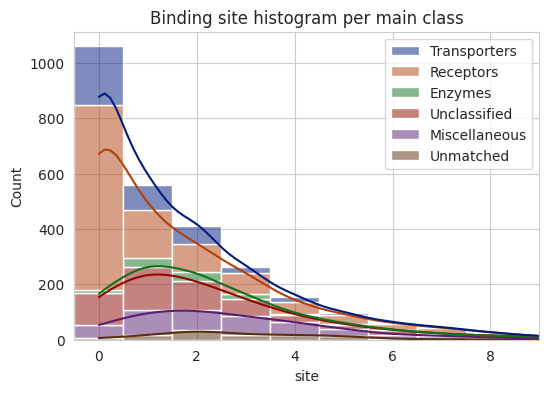

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
g = sns.histplot(data=df_result_no_TM, x="site", hue="main_class", multiple="stack", discrete=True, kde=True, palette="dark")
g.set(xlim=(-0.5,9))
g.legend_.set_title(None)
plt.title("Binding site histogram per main class")
if SAVE_PLOT: plt.savefig("binding_site_hist_all.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show(g)

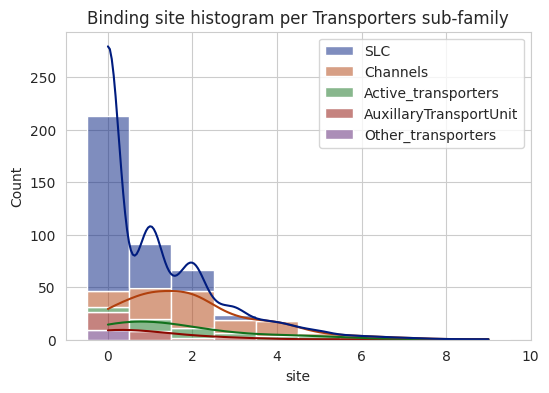

In [29]:
transporters_df_test = df_result_no_TM.loc[df_result_no_TM['main_class'] == "Transporters"]
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
g = sns.histplot(data=transporters_df_test, x="site", hue="sub_class_1", multiple="stack", discrete=True, kde=True, palette="dark")
# g.set(xlim=(-0.5,9))
g.legend_.set_title(None)
plt.title("Binding site histogram per Transporters sub-family")
if SAVE_PLOT: plt.savefig("binding_site_hist_transporters.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show(g)

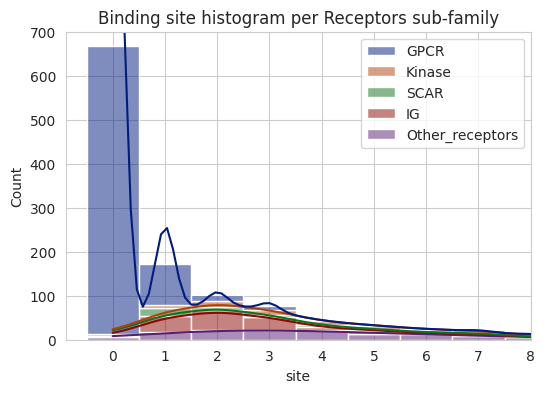

In [30]:
receptor_df_test = df_result_no_TM.loc[df_result_no_TM['main_class'] == "Receptors"]
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
g = sns.histplot(data=receptor_df_test, x="site", hue="sub_class_1", multiple="stack", discrete=True, kde=True, palette="dark")
g.set(xlim=(-0.9,8), ylim=(0,700))
g.legend_.set_title(None)
plt.title("Binding site histogram per Receptors sub-family")
if SAVE_PLOT: plt.savefig("binding_site_hist_receptors.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show(g)

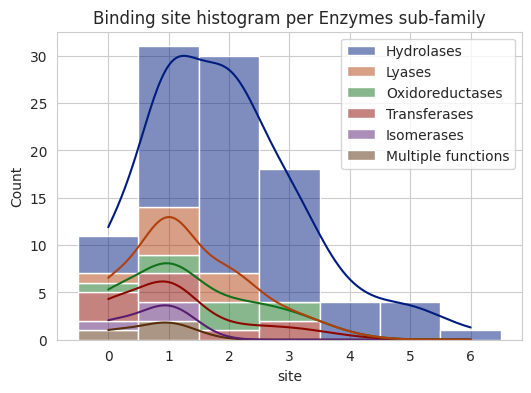

In [31]:
enzymes_df_test = df_result_no_TM.loc[df_result_no_TM['main_class'] == "Enzymes"]
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
g = sns.histplot(data=enzymes_df_test, x="site", hue="sub_class_1", multiple="stack", discrete=True, kde=True, palette="dark")
# g.set(xlim=(-0.5,9))
g.legend_.set_title(None)
plt.title("Binding site histogram per Enzymes sub-family")
if SAVE_PLOT: plt.savefig("binding_site_hist_enzyme.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show(g)

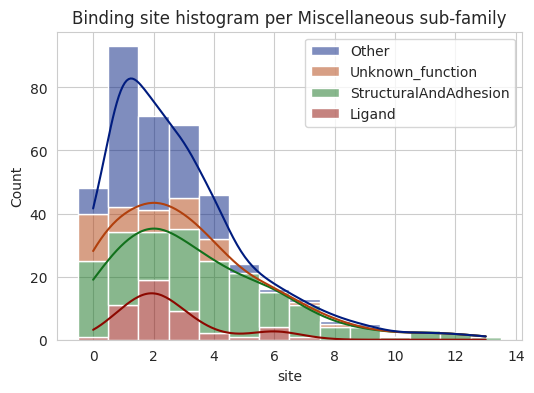

In [32]:
misc_df_test = df_result_no_TM.loc[df_result_no_TM['main_class'] == "Miscellaneous"]
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
g = sns.histplot(data=misc_df_test, x="site", hue="sub_class_1", multiple="stack", discrete=True, kde=True, palette="dark")
# g.set(xlim=(-0.5,9))
g.legend_.set_title(None)
plt.title("Binding site histogram per Miscellaneous sub-family")
if SAVE_PLOT: plt.savefig("binding_site_hist_misc.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show(g)

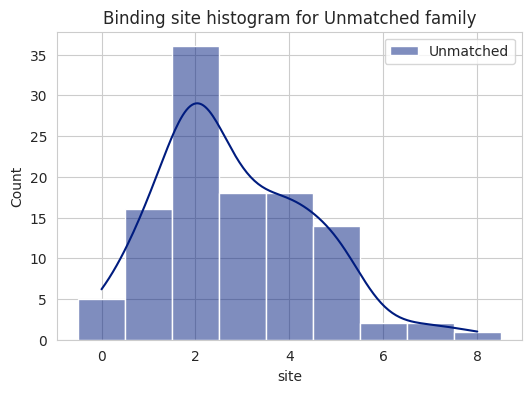

In [33]:
unmatched_df_test = df_result_no_TM.loc[df_result_no_TM['main_class'] == "Unmatched"]
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
g = sns.histplot(data=unmatched_df_test, x="site", hue="sub_class_1", multiple="stack", discrete=True, kde=True, palette="dark")
# g.set(xlim=(-0.5,9))
g.legend_.set_title(None)
plt.title("Binding site histogram for Unmatched family")
if SAVE_PLOT: plt.savefig("binding_site_hist_unmatched.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show(g)

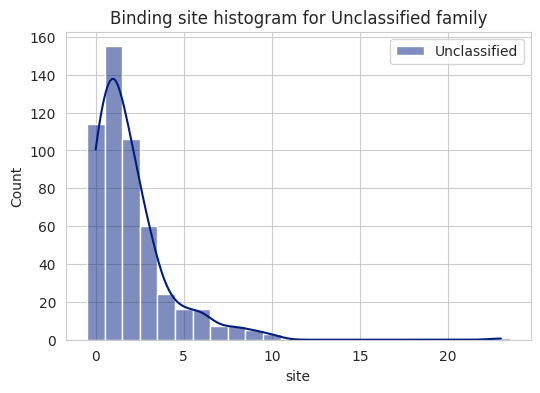

In [34]:
unclassified_df_test = df_result_no_TM.loc[df_result_no_TM['main_class'] == "Unclassified"]
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
g = sns.histplot(data=unclassified_df_test, x="site", hue="sub_class_1", multiple="stack", discrete=True, kde=True, palette="dark")
# g.set(xlim=(-0.5,9))
g.legend_.set_title(None)
plt.title("Binding site histogram for Unclassified family")
if SAVE_PLOT: plt.savefig("binding_site_hist_unclassified.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show(g)

<Axes: xlabel='site', ylabel='Density'>

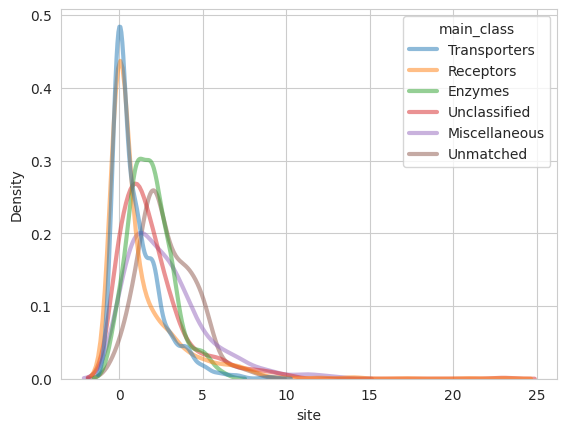

In [35]:
sns.kdeplot(
   data=df_result_no_TM, x="site", hue="main_class",
   common_norm=False,
   alpha=.5, linewidth=3,
)

In [36]:
all_classes = df_result_no_TM["main_class"].unique()
sub_classes = df_result_no_TM["sub_class_1"].unique()
all_classes, sub_classes

(array(['Transporters', 'Receptors', 'Enzymes', 'Unclassified',
        'Miscellaneous', 'Unmatched'], dtype=object),
 array(['SLC', 'GPCR', 'Channels', 'Hydrolases', 'Unclassified',
        'Active_transporters', 'Kinase', 'Lyases', 'Oxidoreductases',
        'Other', 'Unknown_function', 'Unmatched', 'SCAR',
        'AuxillaryTransportUnit', 'StructuralAndAdhesion',
        'Other_transporters', 'IG', 'Other_receptors', 'Transferases',
        'Ligand', 'Isomerases', 'Multiple functions'], dtype=object))

In [37]:
avg_bs_dic = {}
protein_per_family_dic = {}
for item in sub_classes:
    all_no_sites = []
    protein_count = 0
    for index, row in df_result_no_TM.iterrows():
        if row["sub_class_1"] == item:
            all_no_sites.append(int(row["site"]))
            protein_count+=1
    if len(all_no_sites) == 0:
        print("error")
        continue
    else:
        avg_bs_dic[item] = sum(all_no_sites)/len(all_no_sites)
        protein_per_family_dic[item] = protein_count

In [38]:
avg_bs_dic

{'SLC': 0.4340425531914894,
 'GPCR': 0.22020725388601037,
 'Channels': 2.009009009009009,
 'Hydrolases': 2.1940298507462686,
 'Unclassified': 1.9883268482490273,
 'Active_transporters': 2.1578947368421053,
 'Kinase': 4.088235294117647,
 'Lyases': 1.2222222222222223,
 'Oxidoreductases': 1.75,
 'Other': 2.112781954887218,
 'Unknown_function': 1.9387755102040816,
 'Unmatched': 2.8392857142857144,
 'SCAR': 2.782608695652174,
 'AuxillaryTransportUnit': 1.125,
 'StructuralAndAdhesion': 3.6347305389221556,
 'Other_transporters': 0.0,
 'IG': 2.4074074074074074,
 'Other_receptors': 4.164285714285715,
 'Transferases': 1.2222222222222223,
 'Ligand': 2.5,
 'Isomerases': 0.6666666666666666,
 'Multiple functions': 0.6666666666666666}

In [39]:
protein_per_family_dic

{'SLC': 235,
 'GPCR': 772,
 'Channels': 111,
 'Hydrolases': 67,
 'Unclassified': 514,
 'Active_transporters': 38,
 'Kinase': 68,
 'Lyases': 9,
 'Oxidoreductases': 8,
 'Other': 133,
 'Unknown_function': 49,
 'Unmatched': 112,
 'SCAR': 46,
 'AuxillaryTransportUnit': 32,
 'StructuralAndAdhesion': 167,
 'Other_transporters': 9,
 'IG': 135,
 'Other_receptors': 140,
 'Transferases': 9,
 'Ligand': 48,
 'Isomerases': 3,
 'Multiple functions': 3}

## Sunburst Chart representation of the data

In [40]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

In [41]:
import plotly.express as px
import pandas as pd
subclass = [item for item in avg_bs_dic]
mainclass = []
for subs in subclass:
    if subs == "Unclassified":
        mainclass.append(list(set(list(df_result_no_TM[df_result_no_TM['sub_class_1'] == subs]["main_class"])))[0])
    else:
        mainclass.append(list(set(list(df_result_no_TM[df_result_no_TM['sub_class_1'] == subs]["main_class"])))[0])

Surfaceome = ["Surfaceome"] * 22
count = [protein_per_family_dic[c] for c in protein_per_family_dic]
bs = [avg_bs_dic[b] for b in avg_bs_dic]
df = pd.DataFrame(
    dict(subclass=subclass, mainclass=mainclass, Surfaceome=Surfaceome, count=count, BindingSites=bs)
)
print(df)
fig = px.sunburst(df, 
                  path=['Surfaceome', 'mainclass', 'subclass'], 
                  width=900, height=900,
                  values='count',
                  color='BindingSites',
                  color_continuous_scale='RdBu',
                  color_continuous_midpoint=np.average(df['BindingSites'], weights=df['BindingSites']))

fig.update_traces(insidetextorientation="radial")
fig.update_layout(margin = dict(t=0, l=0, r=0, b=0))
# fig.update_traces(textfont=dict(family=['Arial'],size=[0,0,0,0,0]))
fig.show()

                  subclass      mainclass  Surfaceome  count  BindingSites
0                      SLC   Transporters  Surfaceome    235      0.434043
1                     GPCR      Receptors  Surfaceome    772      0.220207
2                 Channels   Transporters  Surfaceome    111      2.009009
3               Hydrolases        Enzymes  Surfaceome     67      2.194030
4             Unclassified   Unclassified  Surfaceome    514      1.988327
5      Active_transporters   Transporters  Surfaceome     38      2.157895
6                   Kinase      Receptors  Surfaceome     68      4.088235
7                   Lyases        Enzymes  Surfaceome      9      1.222222
8          Oxidoreductases        Enzymes  Surfaceome      8      1.750000
9                    Other  Miscellaneous  Surfaceome    133      2.112782
10        Unknown_function  Miscellaneous  Surfaceome     49      1.938776
11               Unmatched      Unmatched  Surfaceome    112      2.839286
12                    SCA

In [42]:
if SAVE_PLOT: fig.write_image("figure.svg", engine="kaleido")

### sunburst graph of the avg seeds per main and sub classes

In [43]:
avg_seed_a_dic = {}
avg_seed_b_dic = {}
for item in sub_classes:
    no_seeds_a = []
    no_seeds_b = []
    for i, row in df_result_no_TM.iterrows():
        if row["sub_class_1"] == item:
            no_seeds_a.append(sum(row["alpha_seeds"]))
            no_seeds_b.append(sum(row["beta_seeds"]))
    
    avg_seed_a_dic[item] = sum(no_seeds_a)/len(no_seeds_a)
    avg_seed_b_dic[item] = sum(no_seeds_b)/len(no_seeds_b)

In [44]:
avg_seed_a_dic, avg_seed_b_dic

({'SLC': 281.5234042553191,
  'GPCR': 93.75,
  'Channels': 597.7387387387388,
  'Hydrolases': 619.2537313432836,
  'Unclassified': 485.1945525291829,
  'Active_transporters': 421.36842105263156,
  'Kinase': 523.3235294117648,
  'Lyases': 37.55555555555556,
  'Oxidoreductases': 630.875,
  'Other': 297.187969924812,
  'Unknown_function': 475.57142857142856,
  'Unmatched': 601.6875,
  'SCAR': 493.80434782608694,
  'AuxillaryTransportUnit': 240.78125,
  'StructuralAndAdhesion': 904.8023952095808,
  'Other_transporters': 0.0,
  'IG': 619.925925925926,
  'Other_receptors': 655.0785714285714,
  'Transferases': 92.44444444444444,
  'Ligand': 735.4166666666666,
  'Isomerases': 22.333333333333332,
  'Multiple functions': 78.33333333333333},
 {'SLC': 353.5404255319149,
  'GPCR': 205.1580310880829,
  'Channels': 2486.9189189189187,
  'Hydrolases': 1765.6567164179105,
  'Unclassified': 1318.147859922179,
  'Active_transporters': 866.5,
  'Kinase': 3087.705882352941,
  'Lyases': 160.22222222222223,


In [45]:
import plotly.express as px
import pandas as pd

count = [protein_per_family_dic[c] for c in protein_per_family_dic]
bs = [avg_bs_dic[b] for b in avg_bs_dic]
seed_a = [avg_seed_a_dic[a] for a in avg_seed_a_dic]
seed_b = [avg_seed_b_dic[b] for b in avg_seed_b_dic]

df = pd.DataFrame(
    dict(subclass=subclass, mainclass=mainclass, Surfaceome=Surfaceome, count=count, seed_a=seed_a, seed_b=seed_b)
)
print(df)
fig = px.sunburst(df, 
                  path=['Surfaceome', 'mainclass', 'subclass'], 
                  width=900, height=900,
                  values='count',
                  color='seed_a',
                  color_continuous_scale='RdBu',
                  color_continuous_midpoint=np.average(df['seed_a'], weights=df['seed_a']))

fig.update_traces(insidetextorientation="radial")
# fig.update_traces(textfont=dict(family=['Arial'],size=[50,20,20,20,20]))
fig.show()

                  subclass      mainclass  Surfaceome  count      seed_a  \
0                      SLC   Transporters  Surfaceome    235  281.523404   
1                     GPCR      Receptors  Surfaceome    772   93.750000   
2                 Channels   Transporters  Surfaceome    111  597.738739   
3               Hydrolases        Enzymes  Surfaceome     67  619.253731   
4             Unclassified   Unclassified  Surfaceome    514  485.194553   
5      Active_transporters   Transporters  Surfaceome     38  421.368421   
6                   Kinase      Receptors  Surfaceome     68  523.323529   
7                   Lyases        Enzymes  Surfaceome      9   37.555556   
8          Oxidoreductases        Enzymes  Surfaceome      8  630.875000   
9                    Other  Miscellaneous  Surfaceome    133  297.187970   
10        Unknown_function  Miscellaneous  Surfaceome     49  475.571429   
11               Unmatched      Unmatched  Surfaceome    112  601.687500   
12          

In [46]:
if SAVE_PLOT: fig.write_image("figure3.svg", engine="kaleido")

In [47]:
import plotly.express as px
import pandas as pd

count = [protein_per_family_dic[c] for c in protein_per_family_dic]
bs = [avg_bs_dic[b] for b in avg_bs_dic]
seed_a = [avg_seed_a_dic[a] for a in avg_seed_a_dic]
seed_b = [avg_seed_b_dic[b] for b in avg_seed_b_dic]

df = pd.DataFrame(
    dict(subclass=subclass, mainclass=mainclass, Surfaceome=Surfaceome, count=count, seed_a=seed_a, seed_b=seed_b)
)
print(df)
fig = px.sunburst(df, 
                  path=['Surfaceome', 'mainclass', 'subclass'], 
                  width=900, height=900,
                  values='count',
                  color='seed_b',
                  color_continuous_scale='RdBu',
                  color_continuous_midpoint=np.average(df['seed_a'], weights=df['seed_a']))

fig.update_traces(insidetextorientation="radial")
# fig.update_traces(textfont=dict(family=['Arial'],size=[50,20,20,20,20]))
fig.show()

                  subclass      mainclass  Surfaceome  count      seed_a  \
0                      SLC   Transporters  Surfaceome    235  281.523404   
1                     GPCR      Receptors  Surfaceome    772   93.750000   
2                 Channels   Transporters  Surfaceome    111  597.738739   
3               Hydrolases        Enzymes  Surfaceome     67  619.253731   
4             Unclassified   Unclassified  Surfaceome    514  485.194553   
5      Active_transporters   Transporters  Surfaceome     38  421.368421   
6                   Kinase      Receptors  Surfaceome     68  523.323529   
7                   Lyases        Enzymes  Surfaceome      9   37.555556   
8          Oxidoreductases        Enzymes  Surfaceome      8  630.875000   
9                    Other  Miscellaneous  Surfaceome    133  297.187970   
10        Unknown_function  Miscellaneous  Surfaceome     49  475.571429   
11               Unmatched      Unmatched  Surfaceome    112  601.687500   
12          

In [48]:
if SAVE_PLOT: fig.write_image("figure4.svg", engine="kaleido")

### bar plots to represent the avg distribution of alpha and beta seeds per sub classes

In [49]:
fig = px.bar(df, y='seed_a', x='subclass', text_auto='.2s', barmode="group",
            title="Average number of seeds per subclass family")
fig.show()

In [50]:
df2 = df.sort_values(by=['mainclass'])
df2

,subclass,mainclass,Surfaceome,count,seed_a,seed_b
21,Multiple functions,Enzymes,Surfaceome,3,78.333333,296.333333
18,Transferases,Enzymes,Surfaceome,9,92.444444,454.111111
3,Hydrolases,Enzymes,Surfaceome,67,619.253731,1765.656716
20,Isomerases,Enzymes,Surfaceome,3,22.333333,263.666667
7,Lyases,Enzymes,Surfaceome,9,37.555556,160.222222
8,Oxidoreductases,Enzymes,Surfaceome,8,630.875000,2085.000000
19,Ligand,Miscellaneous,Surfaceome,48,735.416667,1720.979167
14,StructuralAndAdhesion,Miscellaneous,Surfaceome,167,904.802395,3451.802395
9,Other,Miscellaneous,Surfaceome,133,297.187970,1072.902256
10,Unknown_function,Miscellaneous,Surfaceome,49,475.571429,1007.714286


In [51]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Bar(x=df2.subclass,
                y=df2.seed_a,
                name='alpha seeds',
                marker_color='forestgreen'
                ))
fig.add_trace(go.Bar(x=df2.subclass,
                y=df2.seed_b,
                name='beta seeds',
                marker_color='lightskyblue'
                ))

fig.update_layout(
    title='Avg number of seeds per family',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Avg seeds',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

In [52]:
if SAVE_PLOT: fig.write_image("figure5.svg", engine="kaleido")

In [53]:
df2_int = df2
df2_int['seed_a'] = df2_int['seed_a'].astype(int)
df2_int['seed_b'] = df2_int['seed_b'].astype(int)
df2_int

,subclass,mainclass,Surfaceome,count,seed_a,seed_b
21,Multiple functions,Enzymes,Surfaceome,3,78,296
18,Transferases,Enzymes,Surfaceome,9,92,454
3,Hydrolases,Enzymes,Surfaceome,67,619,1765
20,Isomerases,Enzymes,Surfaceome,3,22,263
7,Lyases,Enzymes,Surfaceome,9,37,160
8,Oxidoreductases,Enzymes,Surfaceome,8,630,2085
19,Ligand,Miscellaneous,Surfaceome,48,735,1720
14,StructuralAndAdhesion,Miscellaneous,Surfaceome,167,904,3451
9,Other,Miscellaneous,Surfaceome,133,297,1072
10,Unknown_function,Miscellaneous,Surfaceome,49,475,1007


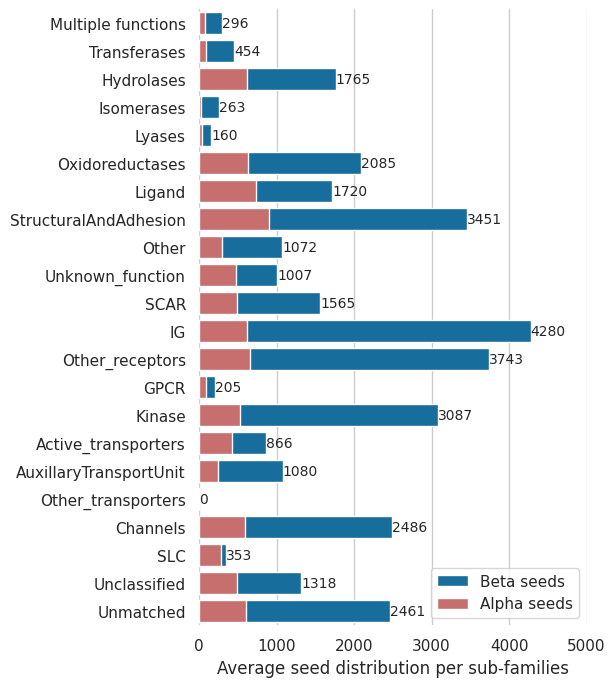

In [54]:
## Another plot to show seed distributions
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="whitegrid")

f, ax = plt.subplots(figsize=(5, 8))

sns.set_color_codes("colorblind")
sns.barplot(x="seed_b", y="subclass", data=df2_int,
            label="Beta seeds", color="b")

sns.set_color_codes("muted")
sns.barplot(x="seed_a", y="subclass", data=df2_int,
            label="Alpha seeds", color="r")

ax.legend(ncol=1, loc="lower right", frameon=True)
ax.set(xlim=(0, 5000), ylabel="",
       xlabel="Average seed distribution per sub-families")
ax.bar_label(ax.containers[0], fontsize=10);

sns.despine(left=True, bottom=True)
if SAVE_PLOT: plt.savefig("seaborn_bar_plot_for_seed_distribution.svg", format='svg', dpi=600, bbox_inches = "tight")

## Flattening all the information, to be able to address each site separately. (array instead of matrix)

In [55]:
def flatten(inp):
    flatlist=[]
    for sublist in inp:
        for element in sublist:
            flatlist.append(element)
    return flatlist

list_acc_flat = list(df_result_no_TM["acc"])
list_mainclass = list(df_result_no_TM["main_class"])
list_subclass = list(df_result_no_TM["sub_class_1"])
list_alpha_seeds2 = list(df_result_no_TM["alpha_seeds"])
list_beta_seeds2 = list(df_result_no_TM["beta_seeds"])
list_area2 = list(df_result_no_TM["area_a2"])
list_bs2 = list(df_result_no_TM["binding_sites"])
list_hp2 = list(df_result_no_TM["hydrophobicity"])

acc_flat = []
for i, item in enumerate(list_alpha_seeds2):
    if item != []:
        acc_flat.append([list_acc_flat[i]]*len(item))
    else:
        acc_flat.append([list_acc_flat[i]])
acc_flat = flatten(acc_flat)

mclasss = []
for i, item in enumerate(list_alpha_seeds2):
    if item != []:
        mclasss.append([list_mainclass[i]]*len(item))
    else:
        mclasss.append([list_mainclass[i]])
mclasss = flatten(mclasss)

sclasss = []
for i, item in enumerate(list_alpha_seeds2):
    if item != []:
        sclasss.append([list_subclass[i]]*len(item))
    else:
        sclasss.append([list_subclass[i]])
sclasss = flatten(sclasss)

seedss_a = []
for i in list_alpha_seeds2:
    if i != []:
        seedss_a.append(i)
    else:
        seedss_a.append([0])
seedss_a = flatten(seedss_a)
        
seedss_b = []
for i in list_beta_seeds2:
    if i != []:
        seedss_b.append(i)
    else:
        seedss_b.append([0])
seedss_b = flatten(seedss_b)

areass = []
for i in list_area2:
    if i != []:
        areass.append(i)
    else:
        areass.append([0])
areass = flatten(areass)

bsss = []
for i in list_bs2:
    if i != []:
        bsss.append(i)
    else:
        bsss.append([0])
bsss = flatten(bsss)

hpss = []
for i in list_hp2:
    if i != []:
        hpss.append(i)
    else:
        hpss.append([0])
hpss = flatten(hpss)

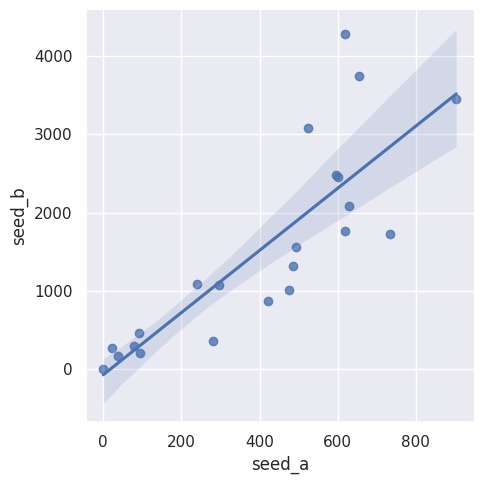

In [56]:
############################
## TESTING SOME NEW PLOTS ##
############################
import seaborn as sns
sns.set_theme(rc={'figure.figsize':(15,10)})
sns.lmplot(data=df2, x="seed_a", y="seed_b")
# plot shows the correlation between average number of alpha and beta seeds
# (each point is average number of seeds for one sub-family).

In [57]:
## Making a new dataframe from all flatened lists to make plots
dict = {'acc_flat':acc_flat, 'main_classs':mclasss, 'sub_classs':sclasss, 'seedss_a':seedss_a, \
        'seedss_b':seedss_b, 'areass':areass, 'bsss':bsss, 'hpss':hpss}
df_sns = pd.DataFrame(dict)
df_sns

,acc_flat,main_classs,sub_classs,seedss_a,seedss_b,areass,bsss,hpss
0,P08195,Transporters,SLC,0,0,0.000000,0,0.00000
1,P08908,Receptors,GPCR,0,0,0.000000,0,0.00000
2,P28222,Receptors,GPCR,0,0,0.000000,0,0.00000
3,P28221,Receptors,GPCR,0,0,0.000000,0,0.00000
4,P28566,Receptors,GPCR,0,0,0.000000,0,0.00000
...,...,...,...,...,...,...,...,...
5611,Q12836,Unclassified,Unclassified,148,339,1589.689128,423,-12.39900
5612,Q12836,Unclassified,Unclassified,1,77,3392.758332,282,13.30000
5613,Q12836,Unclassified,Unclassified,2258,3057,1253.916675,105,-16.40000
5614,Q8TCW7,Unclassified,Unclassified,6,73,5121.634559,241,34.09990


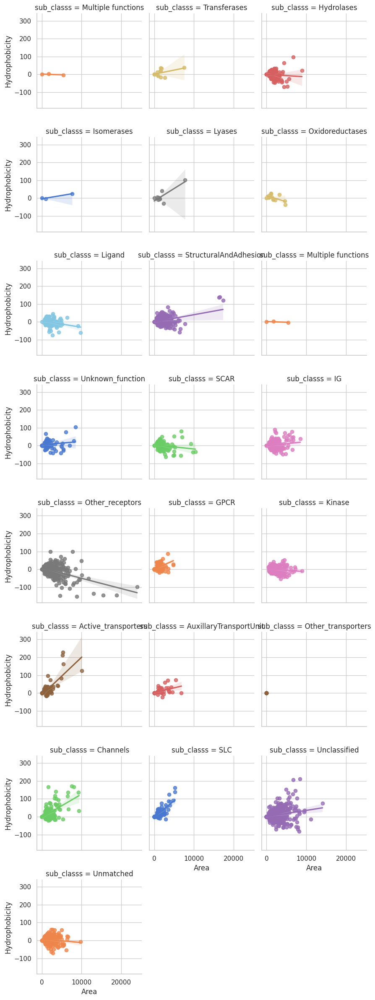

In [58]:
order = ['Multiple functions', 'Transferases', 'Hydrolases', 'Isomerases', 'Lyases', 'Oxidoreductases',
        'Ligand', 'StructuralAndAdhesion', 'Multiple functions', 'Unknown_function',
        'SCAR', 'IG', 'Other_receptors', 'GPCR', 'Kinase',
        'Active_transporters', 'AuxillaryTransportUnit', 'Other_transporters', 'Channels', 'SLC',
        'Unclassified', 'Unmatched']
sns.set_style("whitegrid")
ax = sns.lmplot(
    data=df_sns, x="areass", y="hpss",
    hue="sub_classs", col="sub_classs", height=3, col_wrap=3, col_order=order, palette="muted"
)
ax.set(xlabel ="Area", ylabel = "Hydrophobicity")
if SAVE_PLOT: plt.savefig("correlations_all.svg", format='svg', dpi=600, bbox_inches = "tight")

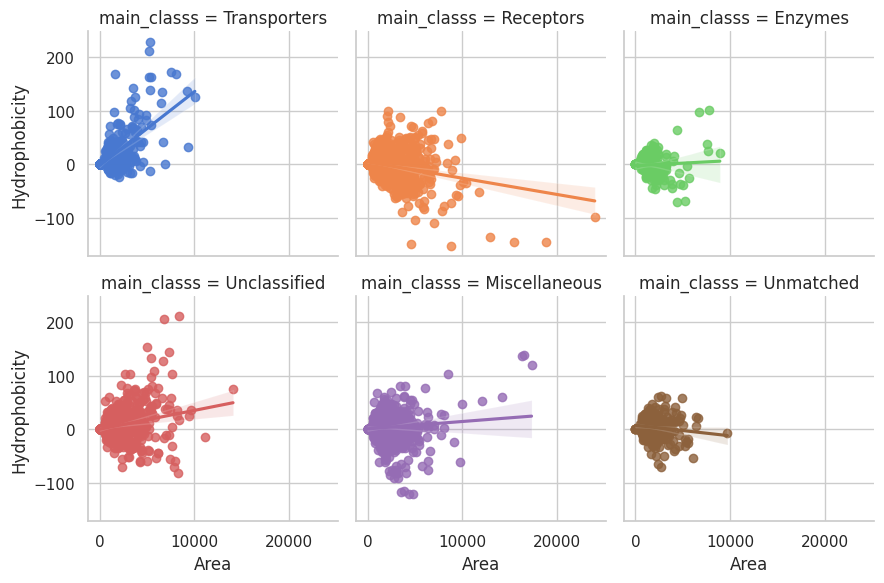

In [59]:
sns.set_style("whitegrid")
ax = sns.lmplot(
    data=df_sns, x="areass", y="hpss",
    hue="main_classs", col="main_classs", height=3, col_wrap=3, palette="muted"
)
ax.set(xlabel ="Area", ylabel = "Hydrophobicity")
if SAVE_PLOT: plt.savefig("correlations_all_main_class.svg", format='svg', dpi=600, bbox_inches = "tight")

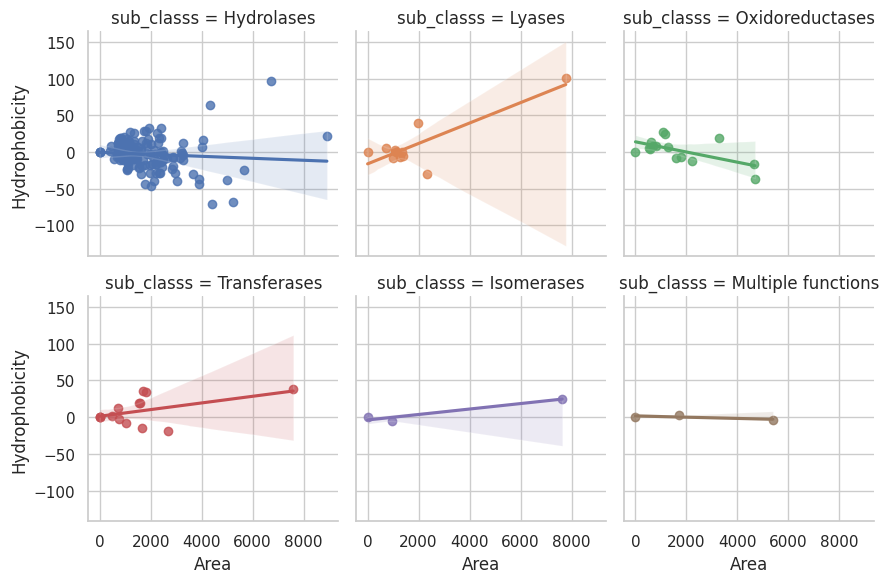

In [60]:
enzyme_df1 = df_sns.loc[df_sns['main_classs'] == "Enzymes"]
ax = sns.lmplot(
    data=enzyme_df1, x="areass", y="hpss",
    hue="sub_classs", col="sub_classs", height=3, col_wrap=3,
)
ax.set(xlabel ="Area", ylabel = "Hydrophobicity")
if SAVE_PLOT: plt.savefig("correlations_enzymes.svg", format='svg', dpi=600, bbox_inches = "tight")

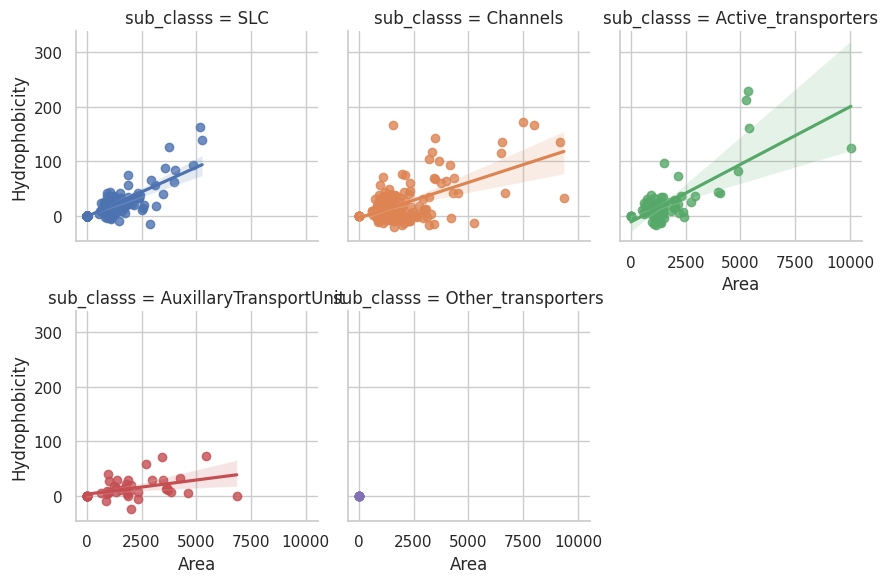

In [61]:
transporters_df1 = df_sns.loc[df_sns['main_classs'] == "Transporters"]
ax = sns.lmplot(
    data=transporters_df1, x="areass", y="hpss",
    hue="sub_classs", col="sub_classs", height=3, col_wrap=3,
)
ax.set(xlabel ="Area", ylabel = "Hydrophobicity")
if SAVE_PLOT: plt.savefig("correlations_transporters.svg", format='svg', dpi=600, bbox_inches = "tight")

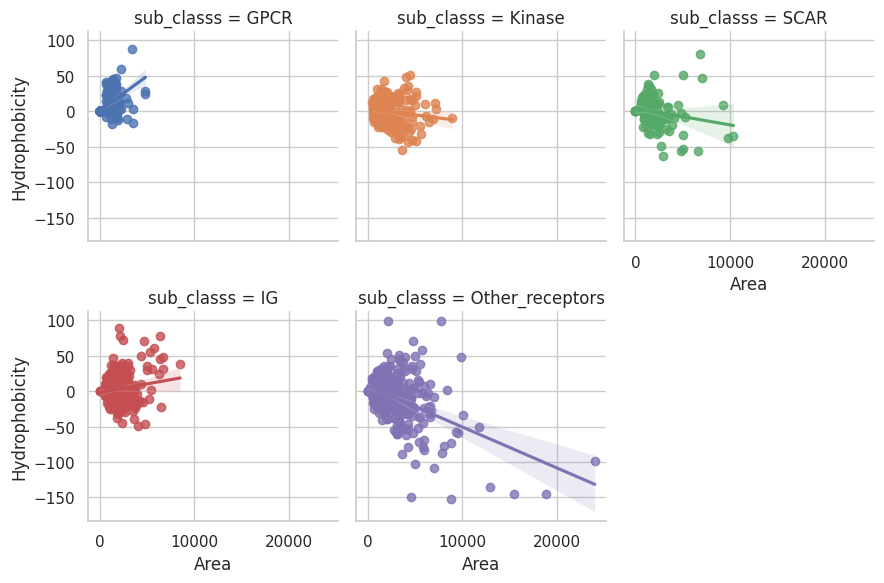

In [62]:
receptors_df1 = df_sns.loc[df_sns['main_classs'] == "Receptors"]
ax = sns.lmplot(
    data=receptors_df1, x="areass", y="hpss",
    hue="sub_classs", col="sub_classs", height=3, col_wrap=3,
)
ax.set(xlabel ="Area", ylabel = "Hydrophobicity")
if SAVE_PLOT: plt.savefig("correlations_receptors.svg", format='svg', dpi=600, bbox_inches = "tight")

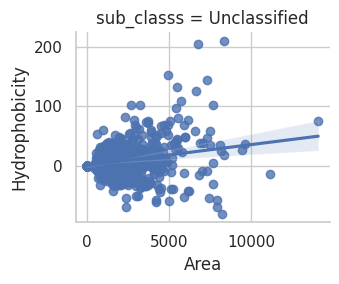

In [63]:
unclassified_df1 = df_sns.loc[df_sns['main_classs'] == "Unclassified"]
ax = sns.lmplot(
    data=unclassified_df1, x="areass", y="hpss",
    hue="sub_classs", col="sub_classs", height=3, col_wrap=3,
)
ax.set(xlabel ="Area", ylabel = "Hydrophobicity")
if SAVE_PLOT: plt.savefig("correlations_unclassified.svg", format='svg', dpi=600, bbox_inches = "tight")

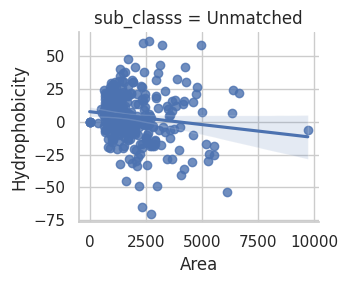

In [64]:
unmatched_df1 = df_sns.loc[df_sns['main_classs'] == "Unmatched"]
ax = sns.lmplot(
    data=unmatched_df1, x="areass", y="hpss",
    hue="sub_classs", col="sub_classs", height=3, col_wrap=3,
)
ax.set(xlabel ="Area", ylabel = "Hydrophobicity")
if SAVE_PLOT: plt.savefig("correlations_unmatched.svg", format='svg', dpi=600, bbox_inches = "tight")

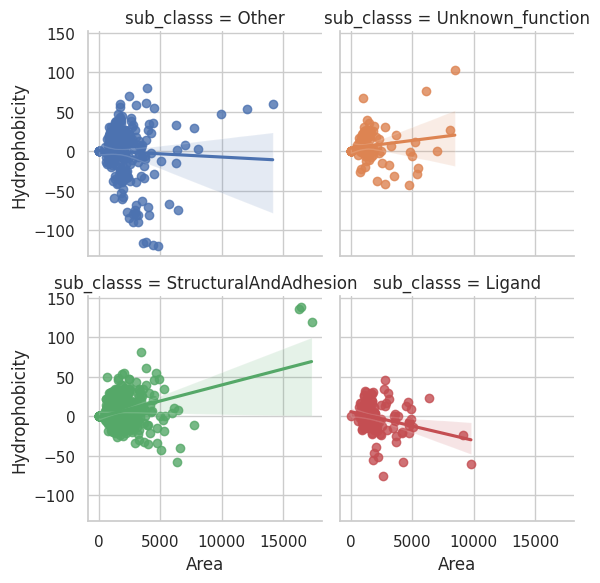

In [65]:
miscellaneous_df1 = df_sns.loc[df_sns['main_classs'] == "Miscellaneous"]
ax = sns.lmplot(
    data=miscellaneous_df1, x="areass", y="hpss",
    hue="sub_classs", col="sub_classs", height=3, col_wrap=2,
)
ax.set(xlabel ="Area", ylabel = "Hydrophobicity")
if SAVE_PLOT: plt.savefig("correlations_miscellaneous.svg", format='svg', dpi=600, bbox_inches = "tight")

In [66]:
## The Radar plot is just an examle over one sub family to see the distribution of all metrics.

In [67]:
def normalize(df):
    result = df.copy()
    for feature_name in df.columns[3:]:
        max_value = df[feature_name].max()
        min_value = df[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value) * 100
    return result

def get_N_HexCol(N):
    HSV_tuples = [(x * 1.0 / N, 0.5, 0.5) for x in range(N)]
    hex_out = []
    for rgb in HSV_tuples:
        rgb = map(lambda x: int(x * 255), colorsys.hsv_to_rgb(*rgb))
        hex_out.append('#%02x%02x%02x' % tuple(rgb))
    return hex_out

In [68]:
enzyme_df23 = enzyme_df1.loc[enzyme_df1['sub_classs'] == "Transferases"]# import plotly.graph_objects as go

categories = ['Alpha seeds','Beta seeds', 'Area',
              'Binding sites', 'Hydrophobicity']

metrics = enzyme_df23.columns[3:].tolist()
enzyme_df23_norm = normalize(enzyme_df23)
enzyme_df23_norm

,acc_flat,main_classs,sub_classs,seedss_a,seedss_b,areass,bsss,hpss
807,Q16880,Enzymes,Transferases,0.000000,0.000000,0.000000,0.00,33.391304
809,Q8WUD6,Enzymes,Transferases,0.000000,0.000000,0.000000,0.00,33.391304
2937,P52961,Enzymes,Transferases,0.000000,0.065020,35.486125,56.75,0.000000
2938,P52961,Enzymes,Transferases,0.289017,25.032510,22.110711,77.75,95.304348
2939,Q13508,Enzymes,Transferases,26.011561,14.434330,13.548563,34.00,19.652174
2940,Q13508,Enzymes,Transferases,0.289017,3.706112,23.835452,3.25,91.826087
2941,Q13508,Enzymes,Transferases,0.000000,3.706112,9.671261,21.50,55.304174
4538,P04843,Enzymes,Transferases,0.000000,2.600780,100.000000,100.00,100.000000
4539,P04843,Enzymes,Transferases,0.289017,0.065020,10.035430,90.25,29.739304
4540,P04843,Enzymes,Transferases,7.514451,6.892068,22.049053,80.00,6.956522


In [69]:
# Function
def plot_radar_chart(data, metrics, title, colors):
    N = len(metrics)
    theta = np.linspace(0, 2 * np.pi, N, endpoint=False)
    theta = np.concatenate([theta, [theta[0]]])
    
    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': 'polar'})
    
    ax.set_title(title, y=1.15, fontsize=20)
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(90)
    ax.spines['polar'].set_zorder(1)
    ax.spines['polar'].set_color('lightgrey')
    
    #color_palette = ['#339F00', '#0500FF', '#9CDADB', '#FF00DE', '#FF9900', '#FFFFFF']
    color_palette = get_N_HexCol(colors)
        
    for idx, (i, row) in enumerate(data.iterrows()):
        values = row[metrics].values.flatten().tolist()
        values = values + [values[0]]
        ax.plot(theta, values, linewidth=1.75, linestyle='solid', label=row['acc_flat'], marker='o', markersize=10, color=color_palette[idx % len(color_palette)])
        ax.fill(theta, values, alpha=0.50, color=color_palette[idx % len(color_palette)])
    
    plt.yticks([0, 25, 50, 75, 100], ["0", "25", "50", "75", "100"], color="black", size=12)
    plt.xticks(theta, metrics + [metrics[0]], color='black', size=12)
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1)) 
    
    return fig

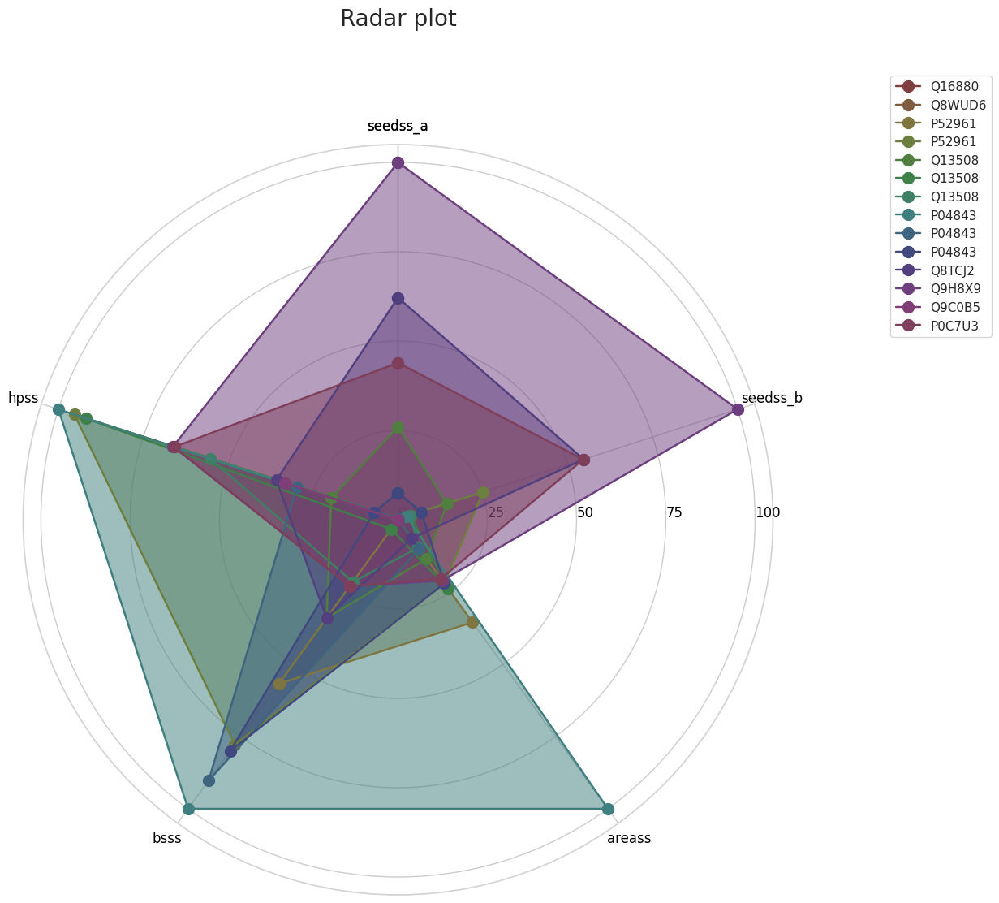

In [70]:
import matplotlib.pyplot as plt
import colorsys
fig = plot_radar_chart(enzyme_df23_norm, metrics, title="Radar plot", colors=14)
plt.show()

In [71]:
## Violin plot for each sub class
import seaborn as sns
sns.set_theme(rc={'figure.figsize':(13,10)})
order = ['Multiple functions', 'Transferases', 'Hydrolases', 'Isomerases', 'Lyases', 'Oxidoreductases',
        'Ligand', 'StructuralAndAdhesion', 'Multiple functions', 'Unknown_function',
        'SCAR', 'IG', 'Other_receptors', 'GPCR', 'Kinase',
        'Active_transporters', 'AuxillaryTransportUnit', 'Other_transporters', 'Channels', 'SLC',
        'Unclassified', 'Unmatched']

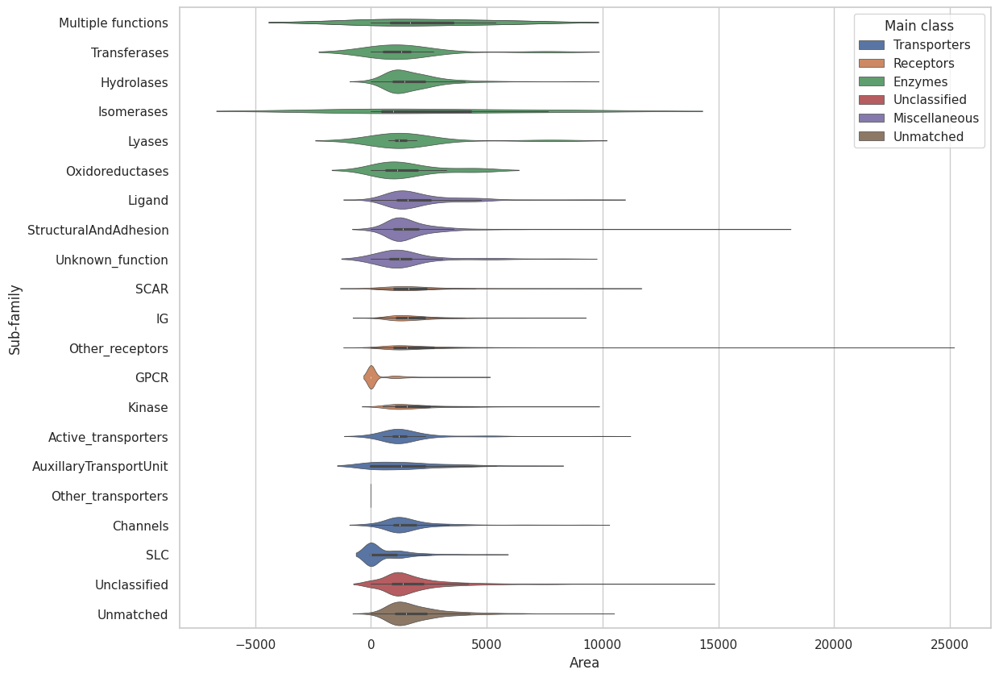

In [72]:
sns.set_style("whitegrid")
ax = sns.violinplot(data=df_sns, x="areass", y="sub_classs", hue="main_classs", linewidth=0.5, order=order)
ax.set(xlabel ="Area", ylabel = "Sub-family")
plt.legend(title='Main class', loc='upper right')
if SAVE_PLOT: plt.savefig("violin_areas_all.svg", format='svg', dpi=600, bbox_inches = "tight")

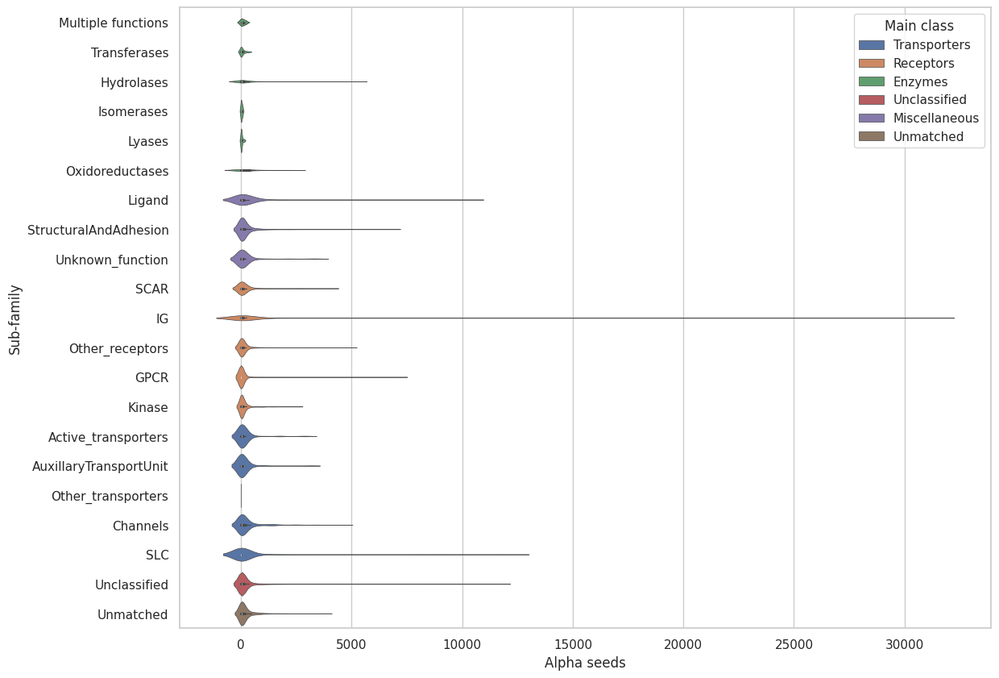

In [73]:
ax = sns.violinplot(data=df_sns, x="seedss_a", y="sub_classs", hue="main_classs", linewidth = 0.5, order=order)
ax.set(xlabel ="Alpha seeds", ylabel = "Sub-family")
plt.legend(title='Main class', loc='upper right')
if SAVE_PLOT: plt.savefig("violin_seeda_all.svg", format='svg', dpi=600, bbox_inches = "tight")

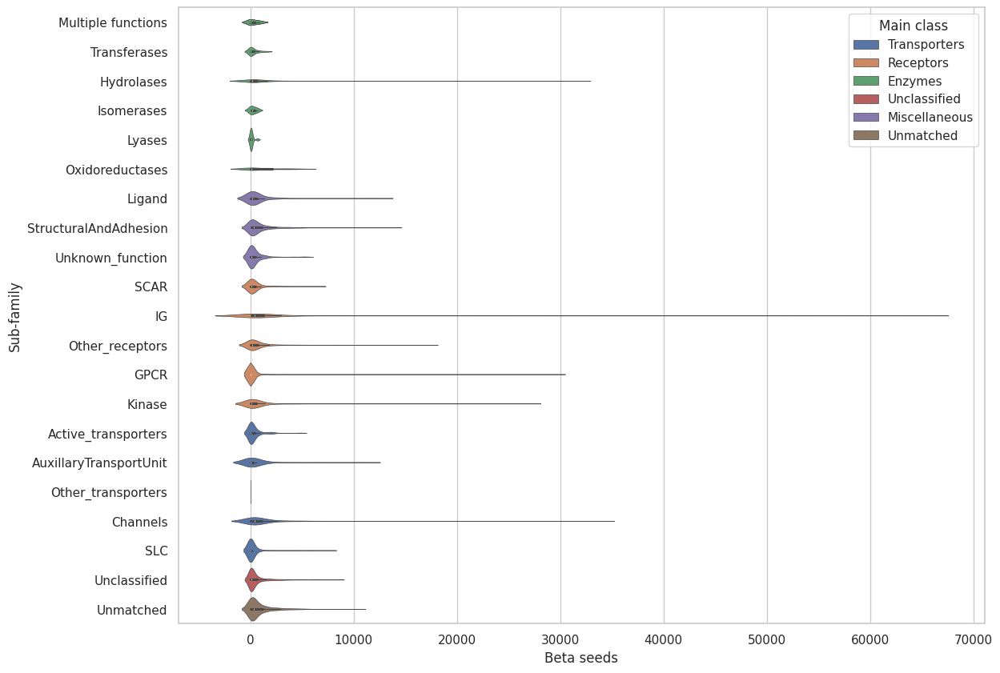

In [74]:
ax = sns.violinplot(data=df_sns, x="seedss_b", y="sub_classs", hue="main_classs", linewidth = 0.5, order=order)
ax.set(xlabel ="Beta seeds", ylabel = "Sub-family")
plt.legend(title='Main class', loc='upper right')
if SAVE_PLOT: plt.savefig("violin_seedb_all.svg", format='svg', dpi=600, bbox_inches = "tight")

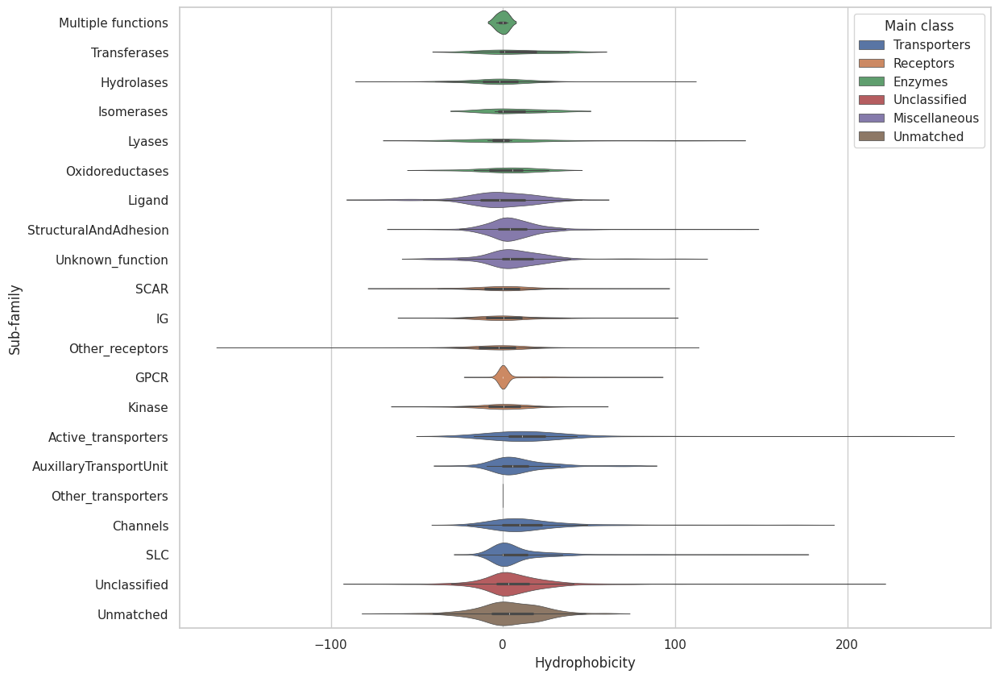

In [75]:
ax = sns.violinplot(data=df_sns, x="hpss", y="sub_classs", hue="main_classs", linewidth = 0.5, order=order)
ax.set(xlabel ="Hydrophobicity", ylabel = "Sub-family")
plt.legend(title='Main class', loc='upper right')
if SAVE_PLOT: plt.savefig("violin_hp_all.svg", format='svg', dpi=600, bbox_inches = "tight")

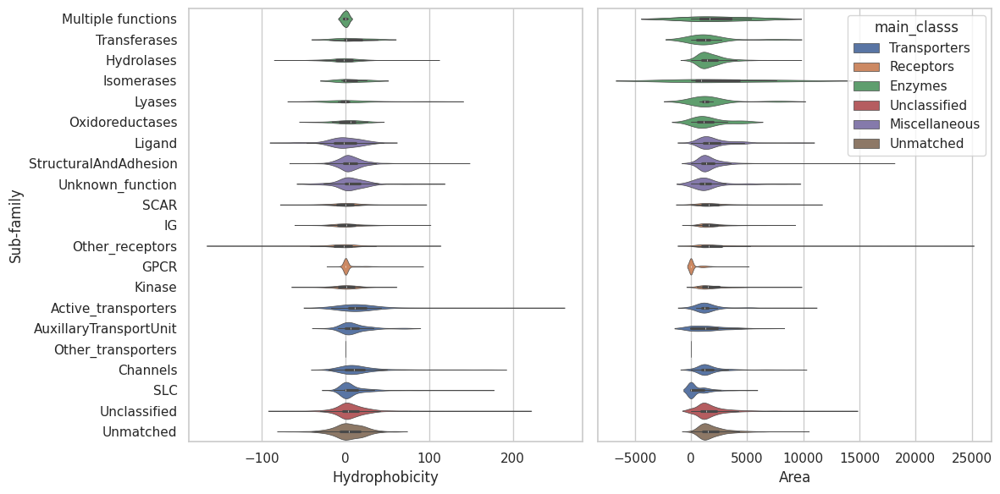

In [76]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
sns.violinplot(
    y=df_sns['sub_classs'],
    x=df_sns['hpss'],
    hue=df_sns['main_classs'],
    linewidth=0.5,
    order=order,
    ax=axes[0]
)
axes[0].set_xlabel('Hydrophobicity')
axes[0].set_ylabel('Sub-family')
axes[0].get_legend().remove()

sns.violinplot(
    y=df_sns['sub_classs'],
    x=df_sns['areass'],
    hue=df_sns['main_classs'],
    linewidth=0.5,
    order=order,
    ax=axes[1]
)
axes[1].set(yticklabels=[])
axes[1].set_ylabel('')
axes[1].set_xlabel('Area')

plt.tight_layout()
if SAVE_PLOT: plt.savefig("violin_hp_area_all.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

## Making plots for each main class based on their sub families

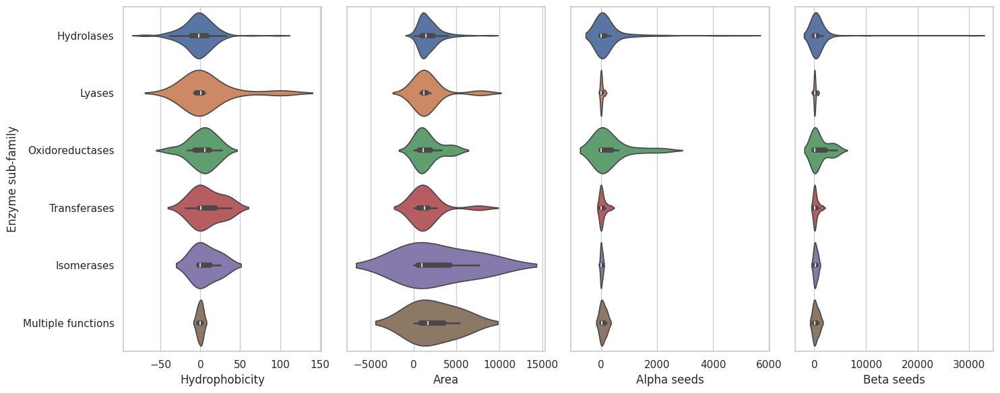

In [77]:
fig, axes = plt.subplots(1, 4, figsize=(15, 6))
sns.violinplot(
    y=enzyme_df1['sub_classs'],
    x=enzyme_df1['hpss'],
    hue=enzyme_df1['sub_classs'],
    ax=axes[0]
)
axes[0].set_xlabel('Hydrophobicity')
axes[0].set_ylabel('Enzyme sub-family')

sns.violinplot(
    y=enzyme_df1['sub_classs'],
    x=enzyme_df1['areass'],
    hue=enzyme_df1['sub_classs'],
    ax=axes[1]
)
axes[1].set(yticklabels=[])
axes[1].set_ylabel('')
axes[1].set_xlabel('Area')

sns.violinplot(
    y=enzyme_df1['sub_classs'],
    x=enzyme_df1['seedss_a'],
    hue=enzyme_df1['sub_classs'],
    ax=axes[2]
)
axes[2].set(yticklabels=[])
axes[2].set_ylabel('')
axes[2].set_xlabel('Alpha seeds')

sns.violinplot(
    y=enzyme_df1['sub_classs'],
    x=enzyme_df1['seedss_b'],
    hue=enzyme_df1['sub_classs'],
    ax=axes[3]
)
axes[3].set(yticklabels=[])
axes[3].set_ylabel('')
axes[3].set_xlabel('Beta seeds')

plt.tight_layout()
if SAVE_PLOT: plt.savefig("violin_hp_area_seeds_enzymes.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

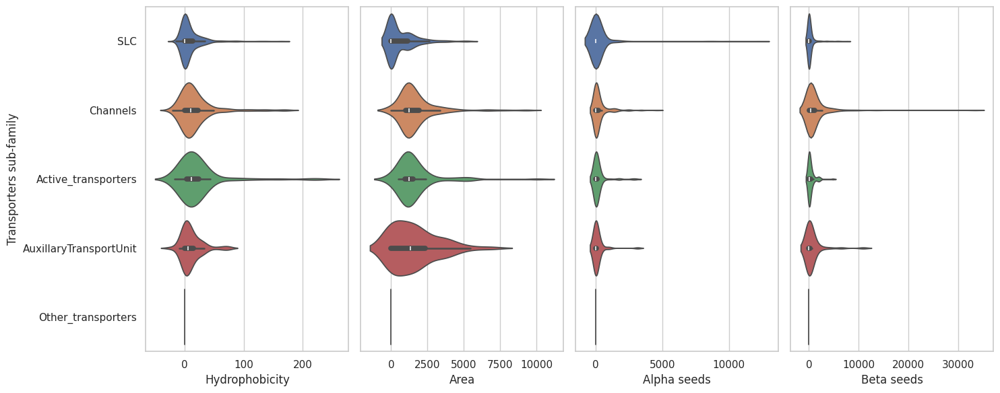

In [78]:
fig, axes = plt.subplots(1, 4, figsize=(15, 6))
sns.violinplot(
    y=transporters_df1['sub_classs'],
    x=transporters_df1['hpss'],
    hue=transporters_df1['sub_classs'],
    ax=axes[0]
)
axes[0].set_xlabel('Hydrophobicity')
axes[0].set_ylabel('Transporters sub-family')

sns.violinplot(
    y=transporters_df1['sub_classs'],
    x=transporters_df1['areass'],
    hue=transporters_df1['sub_classs'],
    ax=axes[1]
)
axes[1].set(yticklabels=[])
axes[1].set_ylabel('')
axes[1].set_xlabel('Area')

sns.violinplot(
    y=transporters_df1['sub_classs'],
    x=transporters_df1['seedss_a'],
    hue=transporters_df1['sub_classs'],
    ax=axes[2]
)
axes[2].set(yticklabels=[])
axes[2].set_ylabel('')
axes[2].set_xlabel('Alpha seeds')

sns.violinplot(
    y=transporters_df1['sub_classs'],
    x=transporters_df1['seedss_b'],
    hue=transporters_df1['sub_classs'],
    ax=axes[3]
)
axes[3].set(yticklabels=[])
axes[3].set_ylabel('')
axes[3].set_xlabel('Beta seeds')

plt.tight_layout()
if SAVE_PLOT: plt.savefig("violin_hp_area_seeds_transporters.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

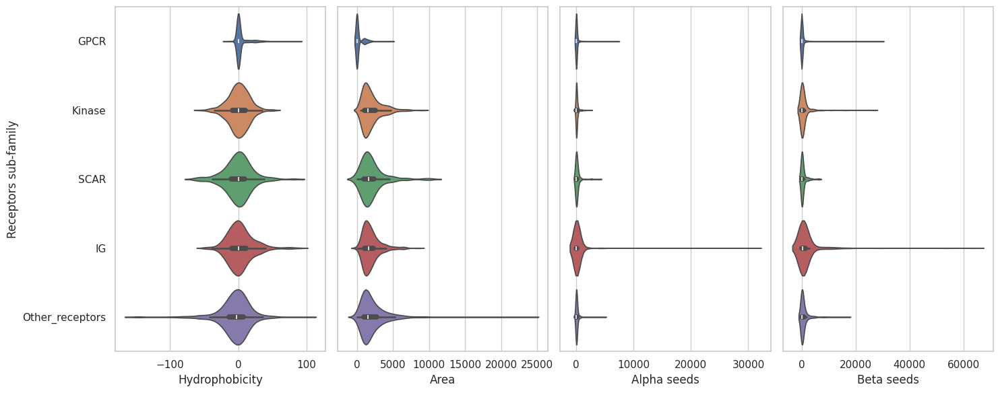

In [79]:
fig, axes = plt.subplots(1, 4, figsize=(15, 6))
sns.violinplot(
    y=receptors_df1['sub_classs'],
    x=receptors_df1['hpss'],
    hue=receptors_df1['sub_classs'],
    ax=axes[0]
)
axes[0].set_xlabel('Hydrophobicity')
axes[0].set_ylabel('Receptors sub-family')

sns.violinplot(
    y=receptors_df1['sub_classs'],
    x=receptors_df1['areass'],
    hue=receptors_df1['sub_classs'],
    ax=axes[1]
)
axes[1].set(yticklabels=[])
axes[1].set_ylabel('')
axes[1].set_xlabel('Area')

sns.violinplot(
    y=receptors_df1['sub_classs'],
    x=receptors_df1['seedss_a'],
    hue=receptors_df1['sub_classs'],
    ax=axes[2]
)
axes[2].set(yticklabels=[])
axes[2].set_ylabel('')
axes[2].set_xlabel('Alpha seeds')

sns.violinplot(
    y=receptors_df1['sub_classs'],
    x=receptors_df1['seedss_b'],
    hue=receptors_df1['sub_classs'],
    ax=axes[3]
)
axes[3].set(yticklabels=[])
axes[3].set_ylabel('')
axes[3].set_xlabel('Beta seeds')

plt.tight_layout()
if SAVE_PLOT: plt.savefig("violin_hp_seeds_area_receptors.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

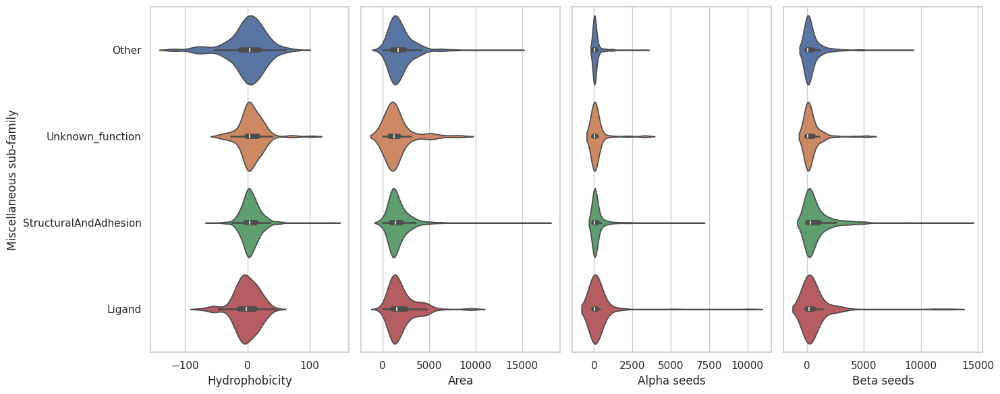

In [80]:
fig, axes = plt.subplots(1, 4, figsize=(15, 6))
sns.violinplot(
    y=miscellaneous_df1['sub_classs'],
    x=miscellaneous_df1['hpss'],
    hue=miscellaneous_df1['sub_classs'],
    ax=axes[0]
)
axes[0].set_xlabel('Hydrophobicity')
axes[0].set_ylabel('Miscellaneous sub-family')

sns.violinplot(
    y=miscellaneous_df1['sub_classs'],
    x=miscellaneous_df1['areass'],
    hue=miscellaneous_df1['sub_classs'],
    ax=axes[1]
)
axes[1].set(yticklabels=[])
axes[1].set_ylabel('')
axes[1].set_xlabel('Area')

sns.violinplot(
    y=miscellaneous_df1['sub_classs'],
    x=miscellaneous_df1['seedss_a'],
    hue=miscellaneous_df1['sub_classs'],
    ax=axes[2]
)
axes[2].set(yticklabels=[])
axes[2].set_ylabel('')
axes[2].set_xlabel('Alpha seeds')

sns.violinplot(
    y=miscellaneous_df1['sub_classs'],
    x=miscellaneous_df1['seedss_b'],
    hue=miscellaneous_df1['sub_classs'],
    ax=axes[3]
)
axes[3].set(yticklabels=[])
axes[3].set_ylabel('')
axes[3].set_xlabel('Beta seeds')

plt.tight_layout()
if SAVE_PLOT: plt.savefig("violin_hp_seeds_area_miscellaneous.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

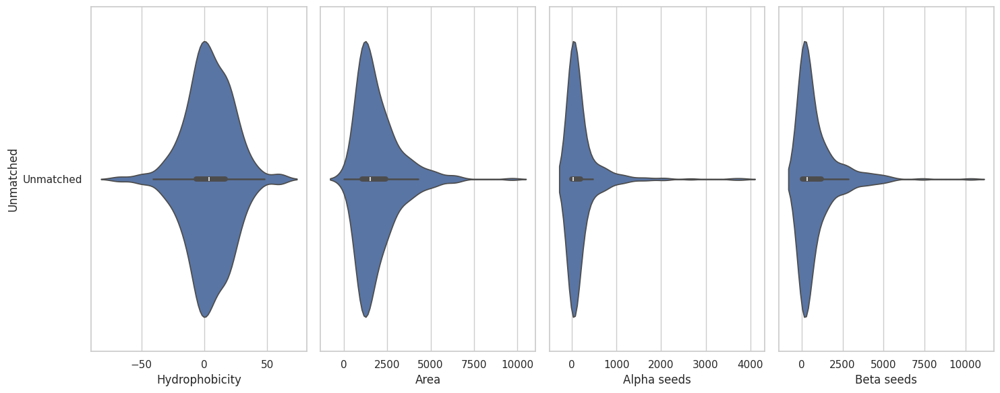

In [81]:
fig, axes = plt.subplots(1, 4, figsize=(15, 6))
sns.violinplot(
    y=unmatched_df1['sub_classs'],
    x=unmatched_df1['hpss'],
    hue=unmatched_df1['sub_classs'],
    ax=axes[0]
)
axes[0].set_xlabel('Hydrophobicity')
axes[0].set_ylabel('Unmatched')

sns.violinplot(
    y=unmatched_df1['sub_classs'],
    x=unmatched_df1['areass'],
    hue=unmatched_df1['sub_classs'],
    ax=axes[1]
)
axes[1].set(yticklabels=[])
axes[1].set_ylabel('')
axes[1].set_xlabel('Area')

sns.violinplot(
    y=unmatched_df1['sub_classs'],
    x=unmatched_df1['seedss_a'],
    hue=unmatched_df1['sub_classs'],
    ax=axes[2]
)
axes[2].set(yticklabels=[])
axes[2].set_ylabel('')
axes[2].set_xlabel('Alpha seeds')

sns.violinplot(
    y=unmatched_df1['sub_classs'],
    x=unmatched_df1['seedss_b'],
    hue=unmatched_df1['sub_classs'],
    ax=axes[3]
)
axes[3].set(yticklabels=[])
axes[3].set_ylabel('')
axes[3].set_xlabel('Beta seeds')

plt.tight_layout()
if SAVE_PLOT: plt.savefig("violin_hp_seeds_area_umatched.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

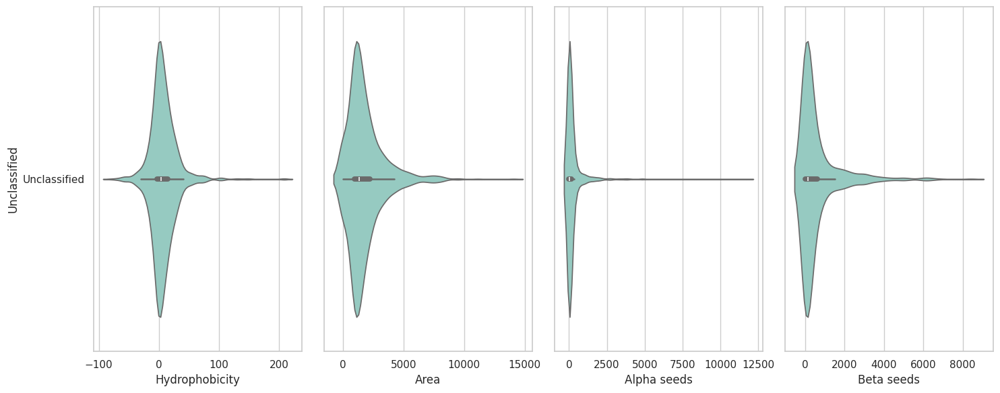

In [82]:
fig, axes = plt.subplots(1, 4, figsize=(15, 6))
sns.violinplot(
    y=unclassified_df1['sub_classs'],
    x=unclassified_df1['hpss'],
    hue=unclassified_df1['sub_classs'],
    palette="Set3",
    ax=axes[0]
)
axes[0].set_xlabel('Hydrophobicity')
axes[0].set_ylabel('Unclassified')

sns.violinplot(
    y=unclassified_df1['sub_classs'],
    x=unclassified_df1['areass'],
    hue=unclassified_df1['sub_classs'],
    palette="Set3",
    ax=axes[1]
)
axes[1].set(yticklabels=[])
axes[1].set_ylabel('')
axes[1].set_xlabel('Area')

sns.violinplot(
    y=unclassified_df1['sub_classs'],
    x=unclassified_df1['seedss_a'],
    hue=unclassified_df1['sub_classs'],
    palette="Set3",
    ax=axes[2]
)
axes[2].set(yticklabels=[])
axes[2].set_ylabel('')
axes[2].set_xlabel('Alpha seeds')

sns.violinplot(
    y=unclassified_df1['sub_classs'],
    x=unclassified_df1['seedss_b'],
    hue=unclassified_df1['sub_classs'],
    palette="Set3",
    ax=axes[3]
)
axes[3].set(yticklabels=[])
axes[3].set_ylabel('')
axes[3].set_xlabel('Beta seeds')

plt.tight_layout()
if SAVE_PLOT: plt.savefig("violin_hp_seeds_area_unclassified.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

<Figure size 600x400 with 0 Axes>

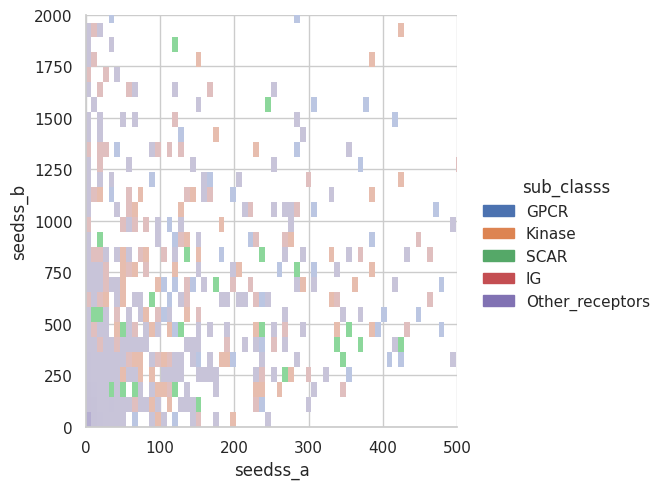

In [83]:
plt.figure(figsize=(6, 4))
sns.set_style("whitegrid")
g = sns.displot(receptors_df1, x="seedss_a", y="seedss_b", hue="sub_classs")
g.set(xlim=(0,500), ylim=(0,2000))
# plt.title("Seed distributions in 2D")
# if SAVE_PLOT: plt.savefig("name.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show(g)

### Bar plot ranking top sites based on their number of a and b detected seeds

In [84]:
index_sorted_a = sorted(range(len(seedss_a)), key = lambda sub: seedss_a[sub], reverse=True)[:20]
index_sorted_b = sorted(range(len(seedss_b)), key = lambda sub: seedss_b[sub], reverse=True)[:20]

top_20_seeds_a = []
top_20_seeds_b = []
for i in index_sorted_a:
    top_20_seeds_a.append({
        "acc": acc_flat[i],
        "site_aa": str(acc_flat[i])+"_"+str(bsss[i]),
        "area": areass[i],
        "hp": hpss[i],
        "seed_a": seedss_a[i]
    })

for j in index_sorted_b:
    top_20_seeds_b.append({
        "acc": acc_flat[j],
        "site_aa": str(acc_flat[j])+"_"+str(bsss[j]),
        "area": areass[j],
        "hp": hpss[j],
        "seed_b": seedss_b[j]
    })
    
df_top_20_seeds_a = pd.DataFrame.from_records(top_20_seeds_a)
df_top_20_seeds_b = pd.DataFrame.from_records(top_20_seeds_b)
df_top_20_seeds_a, df_top_20_seeds_b

(       acc      site_aa         area         hp  seed_a
 0   Q6UXZ4   Q6UXZ4_922  1627.330256    1.19999   31125
 1   Q9ULF5   Q9ULF5_364  1382.773558    7.89999   12209
 2   P55259   P55259_415  2015.078808    6.30000   11842
 3   P13762    P13762_43  3629.529117   -6.40000   10151
 4   Q9UGH3   Q9UGH3_256  3750.162784  125.49900    9965
 5   Q6P5W5   Q6P5W5_209  1239.497928   16.20000    8906
 6   Q6ZMH5   Q6ZMH5_185   970.645277   19.00000    8310
 7   Q92824    Q92824_40  1386.766871    2.59999    7844
 8   P35367   P35367_479  1177.957813   26.19990    7279
 9   Q8N6F1    Q8N6F1_51  1076.622639   29.90000    6872
 10  P29371   P29371_367  1628.599692   34.80000    6214
 11  P31997   P31997_178  1398.881008  -10.90000    5806
 12  Q30154    Q30154_43  3717.650209  -32.99900    5224
 13  P12821   P12821_195  1005.096137    7.60000    5146
 14  O75051  O75051_1285  6585.416799    9.50000    4968
 15  Q13740    Q13740_55  1372.698548   -7.39990    4908
 16  P17927  P17927_1405  1064.

In [85]:
import plotly.express as px
fig = px.scatter(x=df_top_20_seeds_a.hp, y=df_top_20_seeds_a.area, color=df_top_20_seeds_a.site_aa, size=df_top_20_seeds_a.seed_a)
fig.update_layout(
    title="Area vs hydrophobicity - size of points show number of alpha seeds",
    xaxis_title="Hydrophobicity",
    yaxis_title="Area",
    legend_title="Main class"
)
fig.show()

In [86]:
import plotly.express as px
fig = px.scatter(x=df_top_20_seeds_b.hp, y=df_top_20_seeds_b.area, color=df_top_20_seeds_b.site_aa, size=df_top_20_seeds_b.seed_b)
fig.update_layout(
    title="Area vs hydrophobicity - size of points show number of beta seeds",
    xaxis_title="Hydrophobicity",
    yaxis_title="Area",
    legend_title="Main class"
)
fig.show()

In [87]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Bar(x=df_top_20_seeds_a.site_aa,
                y=df_top_20_seeds_a.seed_a,
                name='alpha seeds',
                marker_color='forestgreen'
                ))
fig.add_trace(go.Bar(x=df_top_20_seeds_b.site_aa,
                y=df_top_20_seeds_b.seed_b,
                name='beta seeds',
                marker_color='lightskyblue'
                ))

fig.update_layout(
    title='Number of seeds',
    xaxis_tickfont_size=14,
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

### Scatter plots to represent the no seeds vs binding site area

In [88]:
import plotly.express as px
fig = px.scatter(x=bsss, y=seedss_a, size=areass, color=mclasss)#, log_x=True, log_y=True
fig.update_layout(
    title="No of seeds vs No of binding site",
    xaxis_title="No binding site",
    yaxis_title="No alpha seeds",
    legend_title="Main class"
)
fig.show()

In [89]:
import plotly.express as px
fig = px.scatter(x=bsss, y=seedss_b, size=areass, color=mclasss)#, log_x=True, log_y=True
fig.update_layout(
    title="No of beta seeds vs No of binding site",
    xaxis_title="No binding site",
    yaxis_title="No beta seeds",
    legend_title="Main class"
)
fig.show()

### Scatter plots to represent number of seeds vs binding site hydrophobicity

In [90]:
import plotly.express as px
fig = px.scatter(x=hpss, y=seedss_b, color=mclasss, size=areass, log_y=True)
fig.update_layout(
    title="No of beta seeds vs hydrophobicity",
    xaxis_title="Hydrophobicity",
    yaxis_title="No beta seeds",
    legend_title="Main class"
)
fig.show()

### Scatter plots to represent area vs binding site hydrophobicity and number of seeds as the size of points

In [91]:
import plotly.express as px
fig = px.scatter(x=hpss, y=areass, color=mclasss, size=seedss_b)
fig.update_layout(
    title="Area vs hydrophobicity - size of points show number of seeds",
    xaxis_title="Hydrophobicity",
    yaxis_title="Area",
    legend_title="Main class"
)
fig.show()

### 3D scatter plot to represent avg seeds vs binding site area vs hudrophobicity

In [92]:
import plotly.express as px
fig = px.scatter_3d(x=seedss_b, y=areass, z=hpss,
                   color=mclasss, log_x=True, log_y=True, log_z=True)
fig.update_layout(
    title="Beta seeds vs areas vs hydrophobicity",
    #zaxis_title="Hydrophobicity",
    xaxis_title="No beta seeds",
    yaxis_title="Areas",
    legend_title="Main class"
)

fig.show()

## Seed alignment with known sites

In [93]:
import re
list_res_comp = []
for i,row in result_area.iterrows():
    list_tmp = []
    cluster = row['sequence_compositions_all_clusters'].replace("cluster_","").replace("'", "").replace("{","").replace("]","").replace(":","").replace("}","").split("[")
    for v in cluster:
        p = v.split(",")
        for d in p:
            if "_" in d:
                sss = re.sub('[a-zA-Z_]', '', d)
                ss = re.sub('\s', '', sss)
                list_tmp.append(int(ss))
    list_res_comp.append(list_tmp)
        

In [94]:
acc2exp_sites = "/work/lpdi/users/khakzad/Surfacome/database/acc2sites.tsv"
df_exp_sites = pd.read_csv(acc2exp_sites, sep="\t")
df_exp_sites

,From,Entry,Site,Binding site
0,P08195,P08195,NaN,NaN
1,P08908,P08908,NaN,"BINDING 116; /ligand=""ergotamine""; /ligand_id=..."
2,P28222,P28222,"SITE 355; /note=""Important for species-specifi...","BINDING 129; /ligand=""ergotamine""; /ligand_id=..."
3,P28221,P28221,NaN,"BINDING 118; /ligand=""ergotamine""; /ligand_id=..."
4,P28566,P28566,NaN,"BINDING 102; /ligand=""ergotamine""; /ligand_id=..."
...,...,...,...,...
2703,P60852,P60852,NaN,NaN
2704,Q05996,Q05996,"SITE 172..173; /note=""Cleavage; by ASTL""; /evi...",NaN
2705,P21754,P21754,NaN,NaN
2706,Q12836,Q12836,NaN,NaN


In [95]:
import re
list_exp_sites = []
for i,row in df_exp_sites.iterrows():
    temp_list_exp_sites = []
    exp_site = str(row["Binding site"])
    exp_site_all = exp_site.split(";")
    for items in exp_site_all:
        if "BINDING" in items:
            pp = re.sub('[a-zA-Z_]', '', items)
            ppp = re.sub('\s', '', pp)
            temp_list_exp_sites.append(ppp)
    list_exp_sites.append(temp_list_exp_sites)

In [96]:
list_hits = []
for c, ids in enumerate(list_accs):
    list_hits_tmp = []
    try:
        for d in list_res_comp[c]:
            flag = 0
            for e in list_exp_sites[c]:
                if "." in e:
                    f = e.split("..")
                    if int(f[0])<=int(d) and int(f[1])>=int(d):
                        flag = 1
                else:
                    if int(e) == int(d):
                        flag = 1
            list_hits_tmp.append(flag)
    except(ValueError):
        print("ERROR")
    list_hits.append(list_hits_tmp)

ERROR
ERROR


In [97]:
# df_result_no_TM['exp_sites'] = list_hits
num = 0
for x, hit in enumerate(list_hits):
    if 1 in hit:
        num += 1
        print(list_accs[x])
        print(list_bs[x])
        print(list_res_comp[x])
        print(hit)
        print("================================")
print (num)

P05067
[508, 290, 112, 714]
[297, 298, 299, 300, 301, 302, 303, 320, 322, 323, 324, 385, 386, 387, 388, 391, 392, 395, 398, 399, 402, 403, 406, 407, 410, 413, 414, 417, 432, 436, 439, 440, 443, 446, 447, 450, 451, 454, 455, 457, 458, 459, 461, 462, 464, 465, 466, 467, 468, 469, 470, 473, 474, 477, 480, 500, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 522, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 542, 543, 544, 545, 546, 547, 548, 549, 559, 562, 563, 566, 567, 570, 574, 577, 578, 283, 286, 287, 290, 328, 329, 330, 331, 336, 340, 35, 36, 37, 38, 91, 92, 93, 109, 110, 111, 112, 113, 114, 578, 703, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [98]:
for x, hit in enumerate(list_hits):
    if 1 in hit:
        print("================================")
        print(list_accs[x])
        for y, hitt in enumerate(hit):
            if hitt == 1:
                print(list_res_comp[x][y])

P05067
109
110
Q99758
566
567
571
Q8WWZ7
516
517
519
520
Q8IZY2
841
842
846
Q2M3G0
421
422
425
428
1057
Q9UNQ0
185
186
188
189
190
P36896
215
216
219
220
Q8NER5
201
P37023
229
O43184
350
P78536
405
Q9H013
132
349
O43506
352
Q9UKQ2
169
339
Q9BZ11
133
349
P78325
344
Q08462
297
298
299
338
P30556
182
184
P19021
582
584
Q16671
209
212
213
215
P17342
106
135
Q9H6X2
118
P07306
197
216
242
P27037
204
205
198
199
219
Q13705
196
197
198
199
200
201
202
203
204
217
P82251
47
Q13873
351
P36894
242
245
246
Q10588
109
P12830
257
P33151
177
179
O43570
226
227
P22748
225
226
P15813
98
170
172
P20273
120
Q9NPF0
86
150
P20138
154
P16070
41
Q14CN2
159
P07333
593
596
P29033
42
P04839
222
Q08345
360
361
211
P16444
235
246
36
38
141
168
Q9H4A9
91
P35462
110
P43005
98
P22413
532
535
Q9Y6X5
91
336
Q6UWR7
193
197
P29317
621
622
624
625
626
627
P29320
701
P54764
627
628
629
630
635
653
633
634
P54756
683
Q15375
639
642
643
644
645
P29322
641
642
643
647
649
P54762
651
651
P29323
627
628
633
O15197
677
P21860
7

## Residue frequency in binding sites

In [119]:
amino_acids = ['ALA', 'ARG', 'ASN', 'ASP', 'CYS', 'GLN', 'GLU', 'GLY', 'HIS', 'ILE', 
               'LEU', 'LYS', 'MET', 'PHE', 'PRO', 'SER', 'THR', 'TRP', 'TYR', 'VAL']

ordered_amino_acids = [
    'G', 'A', 'V', 'L', 'I', 'M', 'P',  # Nonpolar, aliphatic
    'F', 'Y', 'W',                      # Aromatic
    'S', 'T', 'C', 'N', 'Q',            # Polar, uncharged
    'K', 'R', 'H',                      # Positively charged
    'D', 'E'                            # Negatively charged
]

# Map full names to single letter codes for amino acids
amino_acid_map = {
    'ALA': 'A', 'ARG': 'R', 'ASN': 'N', 'ASP': 'D', 'CYS': 'C',
    'GLN': 'Q', 'GLU': 'E', 'GLY': 'G', 'HIS': 'H', 'ILE': 'I',
    'LEU': 'L', 'LYS': 'K', 'MET': 'M', 'PHE': 'F', 'PRO': 'P',
    'SER': 'S', 'THR': 'T', 'TRP': 'W', 'TYR': 'Y', 'VAL': 'V'
}

In [120]:
from collections import Counter
import re
pattern = r'[0-9]'
list_AA_freq_dict = [] # a list of dictionaries containing all aa frequencies.
for i, ids in enumerate(list_accs):
    a = list(df_result_no_TM[df_result_no_TM['acc'] == ids]['residues'])[0]
    if a == []:
        list_AA_freq_dict.append({})
    else:
        a1 = ','.join(str(v) for v in a)
        a2 = re.sub(pattern, '', a1)
        b = a2.replace("'","").replace("]},","").replace("]}]","").replace("]}","").replace("{cluster_: ","").replace("[_","").replace(" _","")
        b2 = b.replace("[ ","").split(",")

        freq_counter = Counter(b2)
        freq_dict = {amino_acid_map[aa]: freq_counter.get(aa, 0) for aa in amino_acids}
        list_AA_freq_dict.append(freq_dict)

In [121]:
len(list_AA_freq_dict)

2708

In [122]:
## extending no_TM dataframe
df_result_no_TM['residues_unique'] = list_AA_freq_dict
df_result_no_TM

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds,hydrophobicity,residues,pdbs,residues_unique
0,P08195,0,Transporters,SLC,SLC;Other;SLC3,[],[],[],[],[],[],"[2DH2, 2DH3, 6IRS, 6IRT, 6JMQ, 6JMR, 6S8V, 7B0...",{}
1,P08908,0,Receptors,GPCR,GPCR;Rhodopsin,[],[],[],[],[],[],"[7E2X, 7E2Y, 7E2Z]",{}
2,P28222,0,Receptors,GPCR,GPCR;Rhodopsin,[],[],[],[],[],[],"[4IAQ, 4IAR, 5V54, 6G79, 7C61]",{}
3,P28221,0,Receptors,GPCR,GPCR;Rhodopsin,[],[],[],[],[],[],[7E32],{}
4,P28566,0,Receptors,GPCR,GPCR;Rhodopsin,[],[],[],[],[],[],[7E33],{}
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2703,P60852,2,Unclassified,Unclassified,Unclassified,"[334, 458]","[7082.787541806182, 624.6700168794007]","[0, 154]","[3, 892]","[38.4999, -8.9]","[{'cluster_2': ['42_ASP', '43_CYS', '44_GLY', ...",[],"{'A': 7, 'R': 7, 'N': 3, 'D': 8, 'C': 11, 'Q':..."
2704,Q05996,5,Unclassified,Unclassified,Unclassified,"[255, 356, 380, 598, 435]","[3738.9284872772937, 913.4041013972164, 583.31...","[4, 128, 6, 162, 0]","[3, 219, 36, 233, 0]","[2.19999, 1.5, 5.39999, -3.5999, -11.5]","[{'cluster_2': ['49_PHE', '53_VAL', '55_CYS', ...",[],"{'A': 4, 'R': 5, 'N': 4, 'D': 5, 'C': 4, 'Q': ..."
2705,P21754,3,Unclassified,Unclassified,Unclassified,"[242, 153, 42]","[1516.7376620964585, 1498.159407910869, 1021.3...","[1528, 0, 337]","[6107, 10, 307]","[-7.6, 10.3, -7.6]","[{'cluster_5': ['216_HIS', '218_VAL', '229_PRO...",[],"{'A': 4, 'R': 1, 'N': 1, 'D': 4, 'C': 3, 'Q': ..."
2706,Q12836,4,Unclassified,Unclassified,Unclassified,"[486, 423, 282, 105]","[1003.8522992233186, 1589.6891280967902, 3392....","[0, 148, 1, 2258]","[8, 339, 77, 3057]","[2.59999, -12.399, 13.3, -16.4]","[{'cluster_3': ['337_PRO', '339_VAL', '340_LYS...",[],"{'A': 4, 'R': 7, 'N': 4, 'D': 3, 'C': 3, 'Q': ..."


In [126]:
# Create a DataFrame for better visualization
freq_df = pd.DataFrame(df_result_no_TM['residues_unique'].tolist(), index=df_result_no_TM['acc'])
freq_df['main_class'] = df_result_no_TM['main_class'].tolist()
freq_df['sub_class'] = df_result_no_TM['sub_class_1'].tolist()
grouped_freq_df = freq_df.groupby('main_class').sum()
grouped_freq_df = grouped_freq_df[ordered_amino_acids]
grouped_freq_subclass_df = freq_df.groupby('sub_class').sum()
grouped_freq_subclass_df = grouped_freq_subclass_df[ordered_amino_acids]

In [127]:
grouped_freq_df

,G,A,V,L,I,M,P,F,Y,W,S,T,C,N,Q,K,R,H,D,E
main_class,,,,,,,,,,,,,,,,,,,,
Enzymes,379.0,268.0,384.0,663.0,294.0,141.0,294.0,304.0,251.0,118.0,368.0,270.0,166.0,241.0,204.0,185.0,328.0,155.0,258.0,269.0
Miscellaneous,1759.0,1687.0,2841.0,3749.0,1879.0,686.0,1718.0,1507.0,1239.0,564.0,2182.0,2081.0,593.0,1486.0,1101.0,887.0,1645.0,664.0,1424.0,1433.0
Receptors,2661.0,2382.0,3513.0,5154.0,2373.0,1027.0,2466.0,2157.0,1830.0,799.0,3012.0,2659.0,1532.0,1918.0,1637.0,1542.0,2599.0,1095.0,2061.0,2191.0
Transporters,446.0,678.0,976.0,1815.0,846.0,345.0,326.0,832.0,463.0,266.0,543.0,591.0,254.0,285.0,324.0,341.0,529.0,181.0,262.0,306.0
Unclassified,1641.0,1680.0,2573.0,3828.0,1634.0,635.0,1579.0,1459.0,1048.0,607.0,2062.0,1714.0,977.0,1104.0,1098.0,935.0,1458.0,641.0,1061.0,1282.0
Unmatched,533.0,660.0,762.0,1182.0,420.0,153.0,437.0,434.0,403.0,144.0,715.0,675.0,215.0,342.0,287.0,248.0,485.0,208.0,440.0,401.0


In [128]:
grouped_freq_subclass_df

,G,A,V,L,I,M,P,F,Y,W,S,T,C,N,Q,K,R,H,D,E
sub_class,,,,,,,,,,,,,,,,,,,,
Active_transporters,59.0,112.0,159.0,406.0,152.0,71.0,46.0,132.0,66.0,68.0,94.0,101.0,38.0,38.0,69.0,82.0,97.0,28.0,30.0,53.0
AuxillaryTransportUnit,55.0,81.0,127.0,160.0,68.0,26.0,43.0,77.0,46.0,19.0,90.0,77.0,31.0,45.0,38.0,37.0,69.0,30.0,33.0,37.0
Channels,224.0,334.0,485.0,827.0,424.0,194.0,163.0,415.0,254.0,121.0,266.0,312.0,121.0,163.0,157.0,151.0,263.0,78.0,162.0,186.0
GPCR,75.0,196.0,351.0,541.0,267.0,81.0,103.0,221.0,149.0,71.0,148.0,158.0,83.0,77.0,96.0,66.0,200.0,66.0,90.0,83.0
Hydrolases,310.0,196.0,290.0,494.0,230.0,108.0,228.0,234.0,190.0,89.0,294.0,219.0,141.0,196.0,166.0,149.0,243.0,133.0,219.0,216.0
IG,515.0,492.0,822.0,1194.0,543.0,195.0,665.0,430.0,354.0,234.0,709.0,640.0,186.0,356.0,353.0,325.0,499.0,240.0,335.0,467.0
Isomerases,13.0,7.0,6.0,14.0,11.0,6.0,7.0,5.0,10.0,1.0,5.0,5.0,3.0,3.0,3.0,3.0,10.0,3.0,6.0,2.0
Kinase,566.0,530.0,727.0,942.0,472.0,273.0,454.0,410.0,342.0,109.0,496.0,480.0,197.0,346.0,265.0,341.0,529.0,213.0,447.0,481.0
Ligand,257.0,195.0,269.0,393.0,167.0,65.0,219.0,213.0,172.0,81.0,228.0,244.0,158.0,154.0,149.0,85.0,215.0,105.0,196.0,168.0


In [129]:
# Normalize frequencies by the total frequency of each family
epsilon = 1e-10
grouped_freq_df_norm = grouped_freq_df.div(grouped_freq_df.sum(axis=1) + epsilon, axis=0)
grouped_freq_subclass_df_norm = grouped_freq_subclass_df.div(grouped_freq_subclass_df.sum(axis=1) + epsilon, axis=0)

In [130]:
grouped_freq_df_norm

,G,A,V,L,I,M,P,F,Y,W,S,T,C,N,Q,K,R,H,D,E
main_class,,,,,,,,,,,,,,,,,,,,
Enzymes,0.068412,0.048375,0.069314,0.119675,0.053069,0.025451,0.053069,0.054874,0.045307,0.021300,0.066426,0.048736,0.029964,0.043502,0.036823,0.033394,0.059206,0.027978,0.046570,0.048556
Miscellaneous,0.056514,0.054201,0.091277,0.120450,0.060369,0.022040,0.055197,0.048418,0.039807,0.018120,0.070104,0.066859,0.019052,0.047743,0.035373,0.028498,0.052851,0.021333,0.045751,0.046040
Receptors,0.059653,0.053398,0.078753,0.115540,0.053197,0.023023,0.055282,0.048355,0.041024,0.017912,0.067522,0.059608,0.034344,0.042997,0.036697,0.034568,0.058263,0.024547,0.046202,0.049117
Transporters,0.042040,0.063908,0.091997,0.171081,0.079744,0.032520,0.030729,0.078424,0.043642,0.025073,0.051183,0.055707,0.023942,0.026864,0.030540,0.032143,0.049863,0.017061,0.024696,0.028843
Unclassified,0.056555,0.057899,0.088675,0.131927,0.056314,0.021884,0.054418,0.050283,0.036118,0.020919,0.071064,0.059071,0.033671,0.038048,0.037841,0.032224,0.050248,0.022091,0.036566,0.044183
Unmatched,0.058290,0.072178,0.083333,0.129265,0.045932,0.016732,0.047791,0.047463,0.044073,0.015748,0.078193,0.073819,0.023513,0.037402,0.031387,0.027122,0.053040,0.022747,0.048119,0.043854


In [131]:
grouped_freq_subclass_df_norm

,G,A,V,L,I,M,P,F,Y,W,S,T,C,N,Q,K,R,H,D,E
sub_class,,,,,,,,,,,,,,,,,,,,
Active_transporters,0.031036,0.058916,0.083640,0.213572,0.079958,0.037349,0.024198,0.069437,0.034719,0.035771,0.049448,0.053130,0.019989,0.019989,0.036297,0.043135,0.051026,0.014729,0.015781,0.027880
AuxillaryTransportUnit,0.046257,0.068124,0.106812,0.134567,0.057191,0.021867,0.036165,0.064760,0.038688,0.015980,0.075694,0.064760,0.026072,0.037847,0.031960,0.031119,0.058032,0.025231,0.027754,0.031119
Channels,0.042264,0.063019,0.091509,0.156038,0.080000,0.036604,0.030755,0.078302,0.047925,0.022830,0.050189,0.058868,0.022830,0.030755,0.029623,0.028491,0.049623,0.014717,0.030566,0.035094
GPCR,0.024023,0.062780,0.112428,0.173286,0.085522,0.025945,0.032992,0.070788,0.047726,0.022742,0.047406,0.050609,0.026586,0.024664,0.030750,0.021140,0.064061,0.021140,0.028828,0.026586
Hydrolases,0.071346,0.045109,0.066743,0.113694,0.052934,0.024856,0.052474,0.053855,0.043728,0.020483,0.067664,0.050403,0.032451,0.045109,0.038205,0.034292,0.055926,0.030610,0.050403,0.049712
IG,0.053904,0.051497,0.086037,0.124974,0.056835,0.020410,0.069604,0.045007,0.037053,0.024492,0.074210,0.066988,0.019468,0.037262,0.036948,0.034017,0.052229,0.025120,0.035064,0.048880
Isomerases,0.105691,0.056911,0.048780,0.113821,0.089431,0.048780,0.056911,0.040650,0.081301,0.008130,0.040650,0.040650,0.024390,0.024390,0.024390,0.024390,0.081301,0.024390,0.048780,0.016260
Kinase,0.065661,0.061485,0.084339,0.109281,0.054756,0.031671,0.052668,0.047564,0.039675,0.012645,0.057541,0.055684,0.022854,0.040139,0.030742,0.039559,0.061369,0.024710,0.051856,0.055800
Ligand,0.068845,0.052237,0.072060,0.105277,0.044736,0.017412,0.058666,0.057059,0.046076,0.021698,0.061077,0.065363,0.042325,0.041254,0.039914,0.022770,0.057594,0.028128,0.052505,0.045004


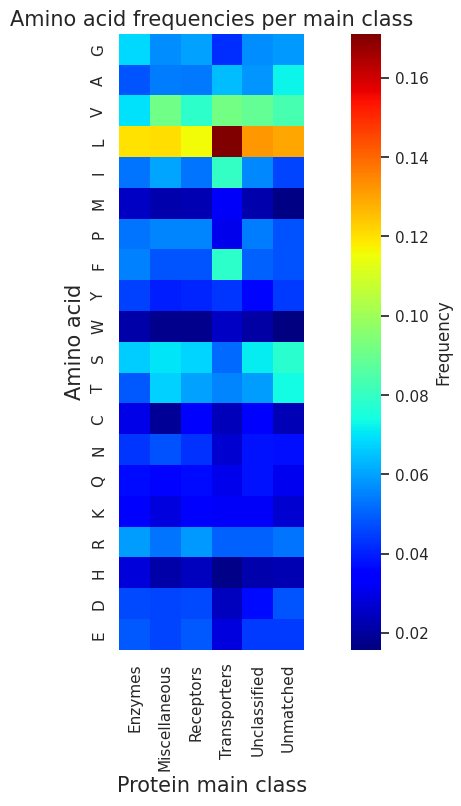

In [134]:
plt.figure(figsize=(12, 8))
sns.heatmap(grouped_freq_df_norm.T, cmap="jet", cbar_kws={'label': 'Frequency'}, square=True)
plt.title('Amino acid frequencies per main class',fontsize=15)
plt.xlabel('Protein main class',fontsize=15)
plt.ylabel('Amino acid',fontsize=15)
if SAVE_PLOT: plt.savefig("heatmap_residue_per_mainclass.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

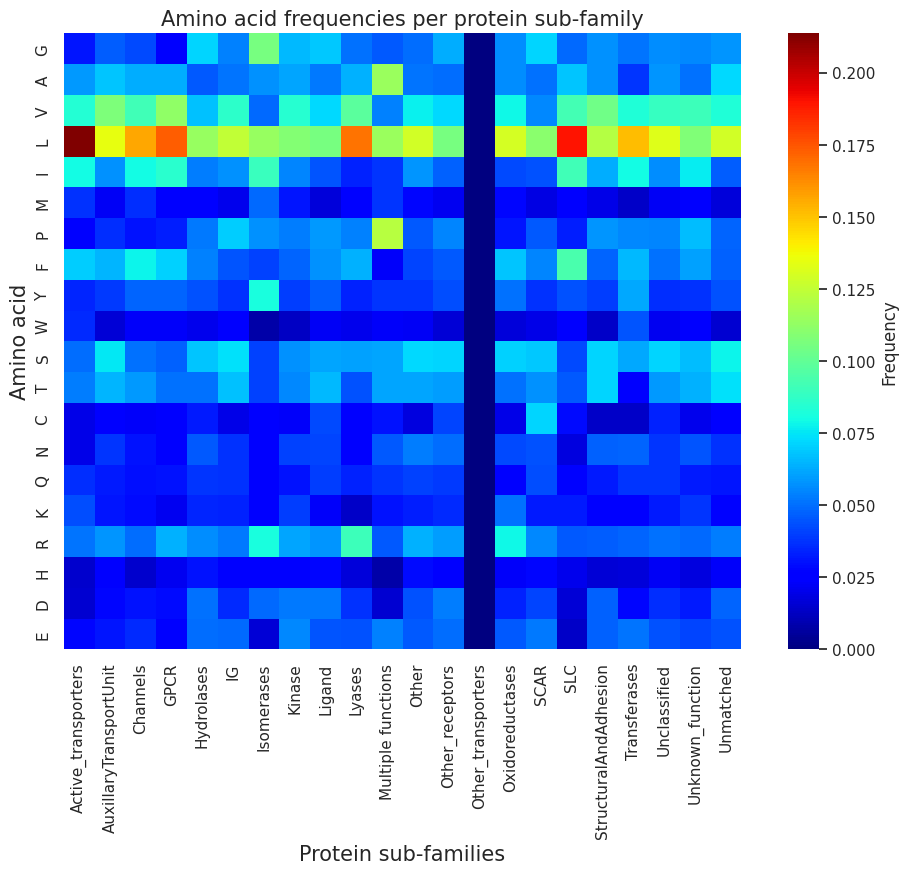

In [135]:
plt.figure(figsize=(12, 8))
sns.heatmap(grouped_freq_subclass_df_norm.T, cmap="jet", cbar_kws={'label': 'Frequency'}, square=True)
plt.title('Amino acid frequencies per protein sub-family',fontsize=15)
plt.xlabel('Protein sub-families',fontsize=15)
plt.ylabel('Amino acid',fontsize=15)
if SAVE_PLOT: plt.savefig("heatmap_residue_per_subclass.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

In [151]:
epsilon = 1e-10
freq_df_new = freq_df.dropna()
freq_df_new = freq_df_new.drop('main_class', axis=1)
freq_df_new = freq_df_new.drop('sub_class', axis=1)
freq_df_new

,A,R,N,D,C,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
acc,,,,,,,,,,,,,,,,,,,,
P46098,1.0,2.0,4.0,2.0,0.0,5.0,3.0,3.0,0.0,6.0,13.0,2.0,2.0,3.0,4.0,6.0,0.0,2.0,9.0,7.0
O95264,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0
Q8WXA8,1.0,0.0,0.0,3.0,0.0,1.0,1.0,1.0,1.0,2.0,6.0,0.0,4.0,4.0,3.0,3.0,2.0,1.0,2.0,3.0
Q70Z44,2.0,2.0,1.0,1.0,2.0,1.0,3.0,0.0,2.0,4.0,3.0,0.0,0.0,4.0,0.0,0.0,0.0,2.0,1.0,6.0
A5X5Y0,0.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,2.0,4.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P60852,7.0,7.0,3.0,8.0,11.0,7.0,2.0,7.0,6.0,7.0,7.0,1.0,2.0,9.0,9.0,8.0,8.0,1.0,4.0,15.0
Q05996,4.0,5.0,4.0,5.0,4.0,7.0,3.0,4.0,4.0,3.0,7.0,4.0,3.0,10.0,8.0,7.0,2.0,2.0,5.0,9.0
P21754,4.0,1.0,1.0,4.0,3.0,0.0,3.0,0.0,3.0,3.0,4.0,1.0,0.0,3.0,5.0,2.0,3.0,1.0,1.0,6.0


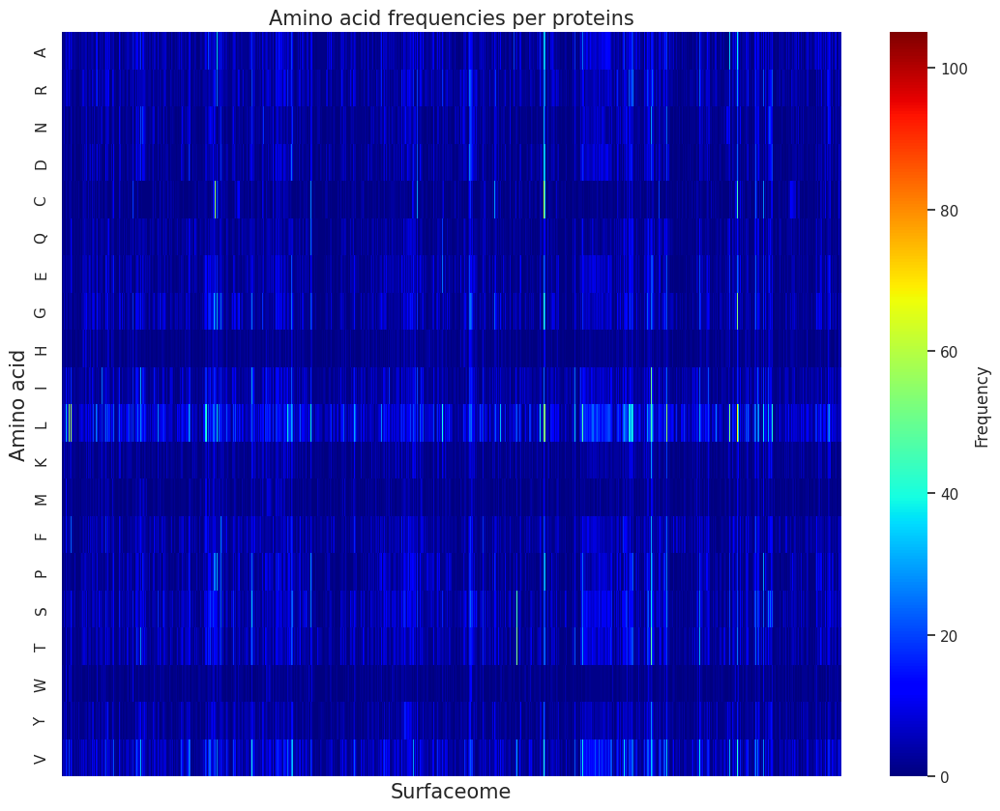

In [161]:
plt.figure()
sns.heatmap(freq_df_new.T, cmap="jet", cbar_kws={'label': 'Frequency'})
plt.title('Amino acid frequencies per proteins',fontsize=15)
plt.xlabel('Surfaceome',fontsize=15)
plt.xticks([])
plt.ylabel('Amino acid',fontsize=15)
if SAVE_PLOT: plt.savefig("heatmap_residue_surfaceome.svg", format='svg', dpi=600, bbox_inches = "tight")
plt.show()

# Receptor family

* Receptor main class is the largest main class in the surfaceome
* The IG, Kinase, and Other_receptors has the most number of detected seeds
* We picked some examples from Kinase and IG sub-families for further evaluation
* While these candidates are selected based on the computational features, we had to also evaluate them experimentaly, to make sure about the possibility of perform different assays such as binding competition, etc.

## Cheking the status and features of some example entries

In [111]:
df_result_no_TM[df_result_no_TM['acc'] == "P21802"] ##675 cluster center is modified during the design

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds,hydrophobicity,residues,pdbs,residues_unique
667,P21802,2,Receptors,Kinase,Kinase;FGFR,"[675, 119]","[4675.780117547691, 717.3466123093547]","[0, 63]","[0, 741]","[15.5, -1.6]","[{'cluster_3': ['172_ALA', '255_ARG', '257_ILE...","[1DJS, 1E0O, 1EV2, 1GJO, 1II4, 1IIL, 1NUN, 1OE...","{'ALA': 9, 'ARG': 5, 'ASN': 3, 'ASP': 4, 'CYS'..."


In [112]:
df_result_no_TM[df_result_no_TM['acc'] == "P21860"] ##91

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds,hydrophobicity,residues,pdbs,residues_unique
623,P21860,6,Receptors,Kinase,Kinase;EGFR,"[738, 764, 945, 272, 282, 91]","[1947.1083182211735, 845.6923077368446, 1566.6...","[0, 0, 52, 143, 0, 2]","[0, 0, 856, 1131, 0, 430]","[-16.2, 14.5, -14.499, -6.0, 4.69999, -7.9]","[{'cluster_2': ['670_ARG', '673_ASN', '674_LYS...","[1M6B, 2L9U, 3KEX, 3LMG, 3P11, 4LEO, 4P59, 4RI...","{'ALA': 5, 'ARG': 6, 'ASN': 3, 'ASP': 7, 'CYS'..."


In [113]:
df_result_no_TM[df_result_no_TM['acc'] == "P48551"] ##107

,acc,site,main_class,sub_class_1,sub_class_all,binding_sites,area_a2,alpha_seeds,beta_seeds,hydrophobicity,residues,pdbs,residues_unique
978,P48551,3,Receptors,IG,IG;Type2;CytokineR,"[193, 48, 107]","[1012.1486248599374, 2724.320111724878, 1393.0...","[0, 15, 0]","[94, 1933, 11]","[-5.8999, -21.4, 18.6999]","[{'cluster_6': ['183_PRO', '184_GLU', '185_ILE...","[1N6U, 1N6V, 2HYM, 2KZ1, 2LAG, 3S8W, 3S9D, 3SE...","{'ALA': 1, 'ARG': 4, 'ASN': 6, 'ASP': 4, 'CYS'..."


In [167]:
print(result_area[result_area['acc'] == "P21802"]["sequence_compositions_all_clusters"].to_list())

["[{'cluster_3': ['172_ALA', '255_ARG', '257_ILE', '258_LEU', '284_ALA', '287_HIS', '288_ILE', '289_GLN', '291_ILE', '293_HIS', '300_LYS', '301_TYR', '302_GLY', '305_GLY', '306_LEU', '307_PRO', '308_TYR', '309_LEU', '310_LYS', '311_VAL', '314_ALA', '339_GLU', '341_THR', '343_LEU', '344_ALA', '345_GLY', '346_ASN', '347_SER', '348_ILE', '349_GLY', '350_ILE', '351_SER', '352_PHE', '353_HIS', '354_SER', '487_LEU', '488_GLY', '489_GLU', '490_GLY', '492_PHE', '493_GLY', '494_GLN', '495_VAL', '515_ALA', '516_VAL', '517_LYS', '519_LEU', '530_ASP', '531_LEU', '548_ILE', '564_VAL', '566_TYR', '567_ALA', '570_GLY', '571_ASN', '573_ARG', '625_ARG', '626_ASP', '628_ALA', '630_ARG', '631_ASN', '633_LEU', '643_ALA', '644_ASP', '646_GLY', '647_LEU', '665_LEU', '666_PRO', '667_VAL', '668_LYS', '673_GLU', '674_ALA', '675_LEU', '676_PHE', '677_ASP', '678_ARG', '679_VAL', '681_THR', '702_SER', '703_PRO', '709_VAL', '710_GLU', '713_PHE']}, {'cluster_8': ['47_PRO', '48_GLU', '49_VAL', '104_LEU', '116_GLU', 